# Homework 7
DASC 512  
Richy Peterson

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns
import statsmodels.api as sm
import statsmodels.stats.api as sms
import statsmodels.graphics.api as smg
import statsmodels.formula.api as smf
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices

sns.set_style('darkgrid')

In [2]:
def linearity_test(model, y):
    '''
    Function for visually inspecting the assumption of linearity in a linear regression model.
    It plots observed vs. predicted values and residuals vs. predicted values.
    It uses Locally Weighted Scatterplot Smoothing (LOWESS) to fit a model. 
    
    Args:
    * model - fitted OLS model from statsmodels
    * y - observed values
    '''
    pred = model.fittedvalues
    influence = model.get_influence()
    resid_std = influence.resid_studentized_internal
    
    fig, ax = plt.subplots(1,2, figsize=(7.5,3.5))
    
    sns.regplot(x=pred, y=y, lowess=True, ax=ax[0], line_kws={'color':'darkorchid'}, marker='.')
    # I've added the ideal line (y=yhat) for comparison
    sns.lineplot(x=[min(pred), max(pred)], y=[min(pred), max(pred)], 
                 ax=ax[0], color='red', ls=':')
    ax[0].set_title('Observed vs. Predicted Values')
    ax[0].set_xlabel('Predicted')
    ax[0].set_ylabel('Observed')
    
    sns.regplot(x=pred, y=resid_std, lowess=True, ax=ax[1], line_kws={'color':'darkorchid'}, marker='.')
    # I've added the ideal line (y=0) for comparison
    sns.lineplot(x=[min(pred), max(pred)], y=[0,0], ax=ax[1], color='red', ls=':')
    ax[1].set_title('Residuals vs. Predicted Values')
    ax[1].set_xlabel('Predicted')
    ax[1].set_ylabel('Standardized Residual')
    
    return fig, ax

In [3]:
df = pd.read_csv('diabetes_students.csv')
df.head()

,Unnamed: 0,AGE,SEX,BMI,BP,S1,S2,S3,S4,S5,S6,Y
0,2,72,Male,30.5,93.0,156,93.6,41.0,4.0,4.6728,85,141.0
1,3,24,Female,25.3,84.0,198,131.4,40.0,5.0,4.8903,89,206.0
2,4,50,Female,23.0,101.0,192,125.4,52.0,4.0,4.2905,80,135.0
3,5,23,Female,22.6,89.0,139,64.8,61.0,2.0,4.1897,68,97.0
4,8,60,Male,32.1,83.0,179,119.4,42.0,4.0,4.4773,94,110.0


In [4]:
# remove the rows that the target variable was removed for testing, remove the unnamed column too
n_total = len(df)
df = df.drop(columns='Unnamed: 0')
X_test = df.iloc[-50:].drop(columns='Y')
df = df.dropna()

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 392 entries, 0 to 391
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AGE     392 non-null    int64  
 1   SEX     392 non-null    object 
 2   BMI     392 non-null    float64
 3   BP      392 non-null    float64
 4   S1      392 non-null    int64  
 5   S2      392 non-null    float64
 6   S3      392 non-null    float64
 7   S4      392 non-null    float64
 8   S5      392 non-null    float64
 9   S6      392 non-null    int64  
 10  Y       392 non-null    float64
dtypes: float64(7), int64(3), object(1)
memory usage: 36.8+ KB


In [6]:
# create dummy variable for SEX, will use 1 = Male
df['Male'] = 0
df.loc[df['SEX']=='Male', 'Male'] = 1
df.describe()

,AGE,BMI,BP,S1,S2,S3,S4,S5,S6,Y,Male
count,392.000000,392.000000,392.000000,392.000000,392.000000,392.000000,392.000000,392.000000,392.000000,392.000000,392.000000
mean,48.612245,26.469388,94.781403,189.295918,115.641582,49.531888,4.089413,4.650294,91.678571,154.048469,0.464286
std,13.238039,4.417314,13.843620,33.978769,30.210071,12.933269,1.311757,0.523727,11.516640,77.509707,0.499360
min,19.000000,18.000000,62.000000,97.000000,41.600000,22.000000,2.000000,3.496500,60.000000,25.000000,0.000000
25%,39.000000,23.300000,84.000000,165.000000,96.200000,40.000000,3.000000,4.276700,84.000000,87.750000,0.000000
50%,50.000000,25.700000,93.000000,187.000000,113.200000,48.000000,4.000000,4.634700,91.000000,142.000000,0.000000
75%,59.000000,29.525000,104.752500,211.000000,135.650000,57.000000,5.000000,5.010600,98.250000,214.250000,1.000000
max,79.000000,42.200000,133.000000,300.000000,242.400000,99.000000,9.090000,6.107000,124.000000,341.000000,1.000000


In [7]:
df_num = df.drop(columns='SEX')

In [8]:
# separate X and  y variables
X = df_num.drop(columns='Y')
y = df_num['Y']

# Split training and validation data
X_train, X_val, y_train, y_val = train_test_split(X,y, test_size=0.15, random_state=49)
# Combine Training X and y
Xy_train = X_train.join(y_train)

print(f'  Training size: {X_train.shape[0]:3}   {X_train.shape[0]/n_total:.3}')
print(f'Validation size: {X_val.shape[0]:3}   {X_val.shape[0]/n_total:.3}')
print(f'      Test size: {X_test.shape[0]:3}   {X_test.shape[0]/n_total:.3}')

  Training size: 333   0.753
Validation size:  59   0.133
      Test size:  50   0.113


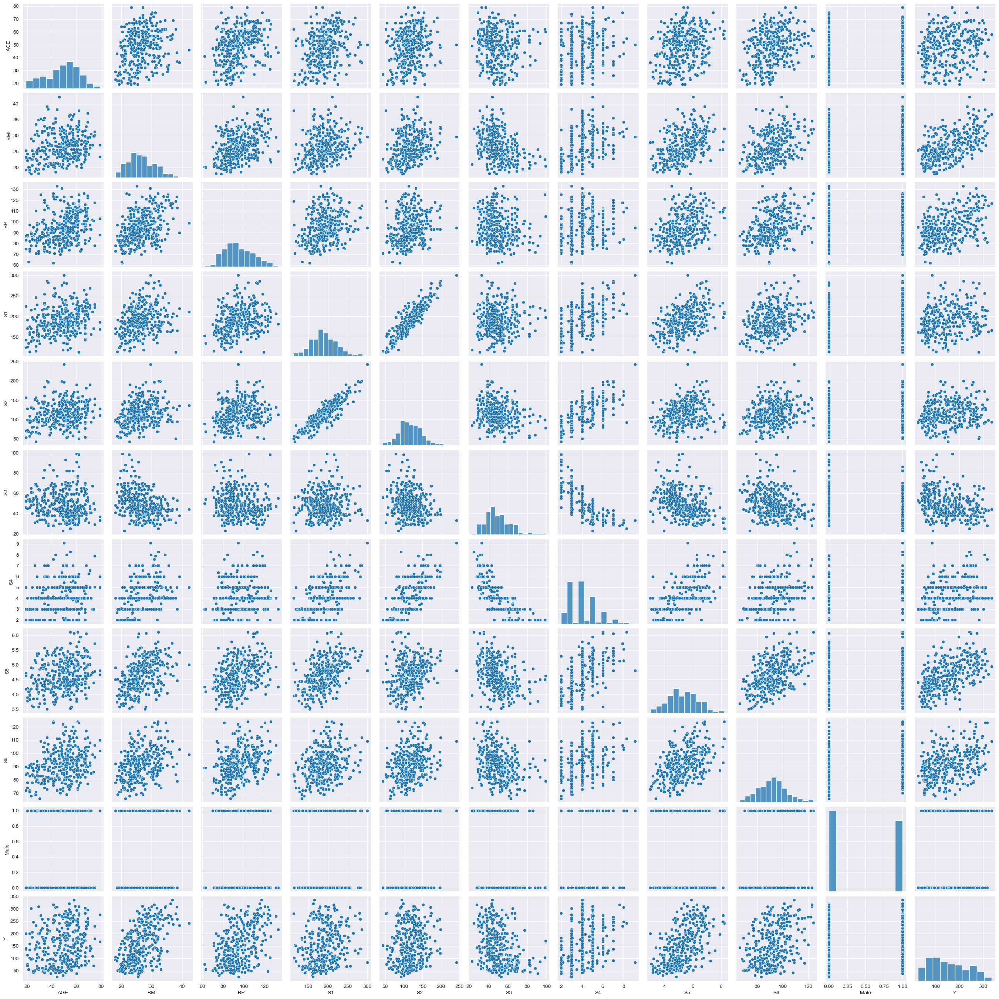

In [9]:
sns.pairplot(Xy_train)

Most variables look like they are somewhat close normally distributed. The target variable 'Y' is the exeption to this.   
There appears to be some multicolinearity amoung the dependent variables. Most noticable with 'S1' and 'S2'. Several of the 'S' terms look like they could have a quadratic association with 'Y'.

<Axes: >

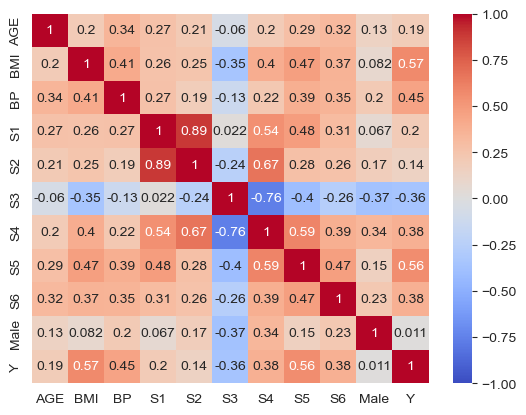

In [10]:
sns.heatmap(Xy_train.select_dtypes(exclude=[object]).corr(), vmin=-1, vmax=1, cmap='coolwarm', annot=True)

Looks like the strongest correlation with Y is the BMI and S5 and then BP.

# First Order Model

In [11]:
# check first order model
formula = 'Y ~ AGE + BMI + BP + S1 + S2 + S3 + S4 + S5 + S6 + Male'
smf.ols(formula, Xy_train).fit().summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                 Results: Ordinary least squares
==================================================================
Model:              OLS              Adj. R-squared:     0.492    
Dependent Variable: Y                AIC:                3625.7186
Date:               2023-08-21 20:27 BIC:                3667.6082
No. Observations:   333              Log-Likelihood:     -1801.9  
Df Model:           10               F-statistic:        33.16    
Df Residuals:       322              Prob (F-statistic): 6.41e-44 
R-squared:          0.507            Scale:              3034.2   
------------------------------------------------------------------
               Coef.   Std.Err.    t    P>|t|    [0.025    0.975] 
------------------------------------------------------------------
Intercept    -342.3471  80.1368 -4.2720 0.0000 -500.0050 -184.6892
AGE            -0.1464   0.2497 -0.5863 0.5581   -0.6376    0.3448
BMI             5.1629   0.8400  6.1463 0.0000    3.5103    6.8154
BP              1.2886   0.2656  4.8518 0.0000    0.7661    1.8112
S1             -0.9162   0.7171 -1.2778 0.2023   -2.3270    0.4945
S2              0.6346   0.6603  0.9611 0.3372   -0.6644    1.9336
S3             -0.0078   0.9501 -0.0082 0.9935   -1.8770    1.8614
S4              1.6752   6.9606  0.2407 0.8100  -12.0188   15.3692
S5             65.0253  18.8187  3.4554 0.0006   28.0022  102.0483
S6              0.5083   0.3217  1.5804 0.1150   -0.1245    1.1412
Male          -25.9023   6.7797 -3.8206 0.0002  -39.2403  -12.5642
------------------------------------------------------------------
Omnibus:               0.274        Durbin-Watson:           1.907
Prob(Omnibus):         0.872        Jarque-Bera (JB):        0.408
Skew:                  0.005        Prob(JB):                0.816
Kurtosis:              2.829        Condition No.:           7386 
==================================================================
* The condition number is large (7e+03). This might indicate
strong multicollinearity or other numerical problems.
"""

In [12]:
# backward regresion
# terms removed interatively in this cell, in order (not showing all model results for to save room): S4, AGE, S3, S6
formula = 'Y ~ BMI + BP + S1 + S2 + S5 + Male'
model = smf.ols(formula, Xy_train).fit()
model.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                 Results: Ordinary least squares
==================================================================
Model:              OLS              Adj. R-squared:     0.494    
Dependent Variable: Y                AIC:                3620.5738
Date:               2023-08-21 20:27 BIC:                3647.2308
No. Observations:   333              Log-Likelihood:     -1803.3  
Df Model:           6                F-statistic:        55.01    
Df Residuals:       326              Prob (F-statistic): 1.08e-46 
R-squared:          0.503            Scale:              3022.7   
------------------------------------------------------------------
              Coef.   Std.Err.    t     P>|t|    [0.025    0.975] 
------------------------------------------------------------------
Intercept   -330.7055  30.0985 -10.9875 0.0000 -389.9172 -271.4937
BMI            5.3281   0.8290   6.4269 0.0000    3.6972    6.9590
BP             1.3022   0.2550   5.1073 0.0000    0.8006    1.8038
S1            -1.0097   0.2581  -3.9124 0.0001   -1.5175   -0.5020
S2             0.7705   0.2618   2.9428 0.0035    0.2554    1.2855
S5            71.4857   8.4417   8.4682 0.0000   54.8786   88.0927
Male         -24.4643   6.6281  -3.6910 0.0003  -37.5036  -11.4250
------------------------------------------------------------------
Omnibus:               0.111        Durbin-Watson:           1.889
Prob(Omnibus):         0.946        Jarque-Bera (JB):        0.224
Skew:                  0.018        Prob(JB):                0.894
Kurtosis:              2.878        Condition No.:           2496 
==================================================================
* The condition number is large (2e+03). This might indicate
strong multicollinearity or other numerical problems.
"""

Check the residuals

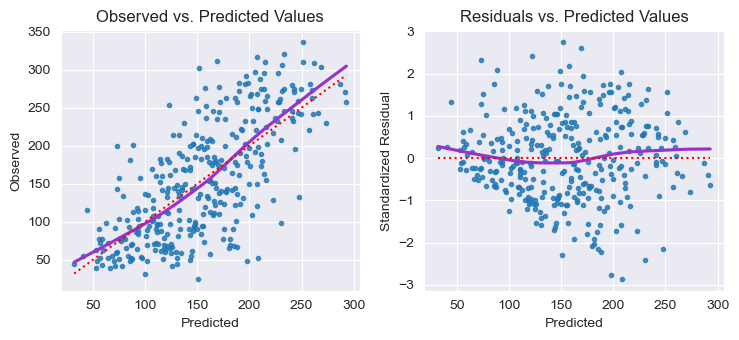

In [13]:
resid = model.resid
pred = model.fittedvalues

plt.rc('font',size=10)
fig, ax = linearity_test(model, y_train)
fig.tight_layout()

Not perfect, but not horhible. Looks like prediction are higher more often for lower values and lower for higher values

In [14]:
# error normally distributed
plt.rc('font',size=14)
def plot_resid_dist_qqplot(model):
    fig, axs = plt.subplots(1,2, figsize=(11,5))
    sns.histplot(model.resid,ax=axs[0])
    sm.qqplot(model.resid, fit=True, line='45', ax=axs[1])

    axs[0].set_xlabel('Residuals')
    axs[0].set_title('Distribution of Residuals')
    axs[1].set_title('QQ plot of Residuals')
    fig.tight_layout()
    return fig, axs

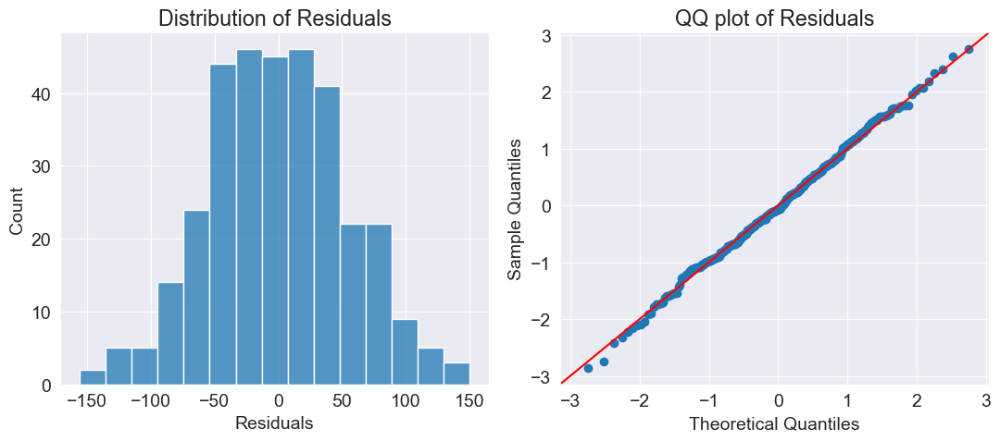

In [15]:
fig, axs = plot_resid_dist_qqplot(model)
# fig.savefig('hist_resid.png')

Distribution and QQ-plot look good

In [16]:
stats.normaltest(resid)

NormaltestResult(statistic=0.1111244030202147, pvalue=0.9459531821240181)

In [17]:
# outliers and influence points
influence = model.get_influence()
standard_resid = influence.resid_studentized_internal
student_resid = influence.resid_studentized_external
def plot_stand_stud_resid(model):
    influence = model.get_influence()
    standard_resid = influence.resid_studentized_internal
    student_resid = influence.resid_studentized_external
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(11,5), sharey=True)
    sns.scatterplot(x=model.predict(), y=standard_resid, ax=ax1)
    sns.scatterplot(x=model.predict(), y=student_resid, ax=ax2)
    for ax in [ax1,ax2]:
        xlim = ax.get_xlim()
        ax.axvline(x=xlim[0] + 1/3*(xlim[1]-xlim[0]), color='orchid', linestyle='--')
        ax.axvline(x=xlim[0] + 2/3*(xlim[1]-xlim[0]), color='orchid', linestyle='--')
        ax.axhline(y=0, color='orchid', linestyle='--')
        ax.set_xlabel('$\hat{y}$')
        ax.set_ylabel('Residuals')
    ax1.set_title('Standardized Residuals')
    ax2.set_title('Studentized Residuals')
    fig.tight_layout()
    return fig, (ax1, ax2)

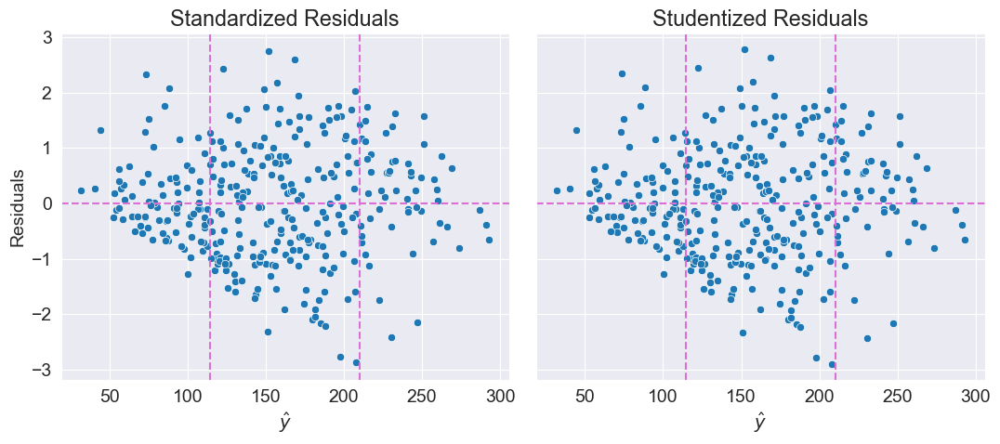

In [18]:
fig, (ax1, ax2) = plot_stand_stud_resid(model)
# fig.savefig('stand_stud_resid.png')

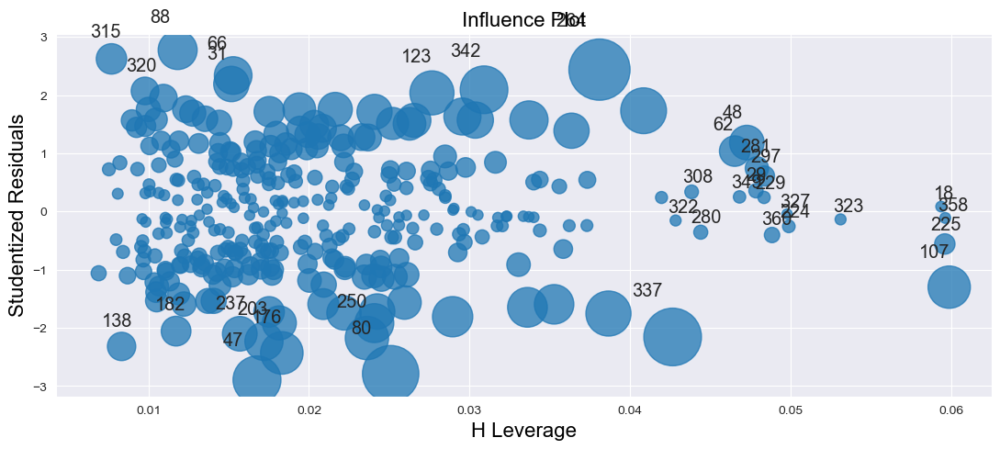

In [19]:
plt.rc('font',size=10)
fig, ax = plt.subplots(figsize=(11,5))
smg.influence_plot(model, ax=ax)
fig.tight_layout()

In [20]:
# get influence points indicated in the plot, so I don't have to copy them by hand
# high residuals: |stud_resid| > t.ppf(1-alpha/2, df=df_resid) default alpha=.05; 
# high leverage: hat_i > 2(df_model + 1)/nobs;  
# source: https://www.statsmodels.org/dev/generated/statsmodels.graphics.regressionplots.influence_plot.html)
infpts = Xy_train[influence.hat_matrix_diag > 2 * (model.df_model + 1)/model.nobs].index
alpha=0.05
outliers = Xy_train[abs(influence.resid_studentized) > stats.t.ppf(1-alpha/2, df=model.df_resid)].index

In [21]:
# create a dataframe so the standardized and studentized residuals have the same index for plotting influence points
pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})

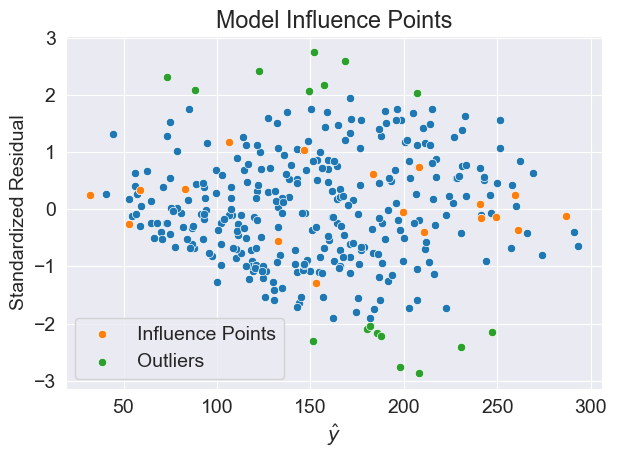

In [22]:
plt.rc('font',size=14)
fig, ax = plt.subplots()
sns.scatterplot(x=model.predict(), y=standard_resid, ax=ax)
sns.scatterplot(x=pred_df.loc[infpts]['pred'], y=pred_df.loc[infpts]['stand_res'], ax=ax, label='Influence Points')
sns.scatterplot(x=pred_df.loc[outliers]['pred'], y=pred_df.loc[outliers]['stand_res'], ax=ax, label='Outliers')
ax.set_title('Model Influence Points')
ax.set_xlabel('$\hat{y}$')
ax.set_ylabel('Standardized Residual')
fig.tight_layout()
# fig.savefig('influence_points.png')

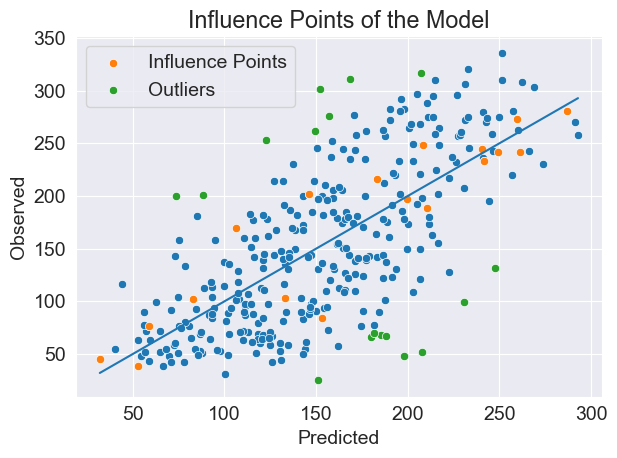

In [23]:
plt.rc('font',size=14)
fig, ax = plt.subplots()
sns.scatterplot(x=model.fittedvalues, y=y_train, ax=ax)
sns.scatterplot(x=pred[infpts], y=y_train[infpts], ax=ax, label='Influence Points')
sns.scatterplot(x=pred[outliers], y=y_train[outliers], ax=ax, label='Outliers')
sns.lineplot(x=model.fittedvalues, y=model.fittedvalues, ax=ax)
ax.set_title('Influence Points of the Model')
ax.set_xlabel('Predicted')
ax.set_ylabel('Observed')
fig.tight_layout()
# fig.savefig('influence_points_model_obs_pred.png')

In [24]:
# check multicolinearity (Variance Inflation Factors)
_, Xdm = dmatrices(formula, data=Xy_train, return_type='dataframe')
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(Xdm.values, ii) for ii in range(Xdm.shape[1])]
vif['features'] = Xdm.columns
print(vif)

         VIF   features
0  99.800229  Intercept
1   1.489105        BMI
2   1.342614         BP
3   8.027311         S1
4   6.853965         S2
5   2.093477         S5
6   1.205129       Male


As suspected there is multicolinearity between S1 and S2

## Modify Model

### Remove S2 to get rid of multicolinearity
chosing S2 because it had the higher p-value

                 Results: Ordinary least squares
Model:              OLS              Adj. R-squared:     0.482    
Dependent Variable: Y                AIC:                3627.3045
Date:               2023-08-21 20:27 BIC:                3650.1533
No. Observations:   333              Log-Likelihood:     -1807.7  
Df Model:           5                F-statistic:        62.81    
Df Residuals:       327              Prob (F-statistic): 8.79e-46 
R-squared:          0.490            Scale:              3093.6   
------------------------------------------------------------------
              Coef.   Std.Err.    t     P>|t|    [0.025    0.975] 
------------------------------------------------------------------
Intercept   -329.8096  30.4474 -10.8321 0.0000 -389.7071 -269.9121
BMI            5.9475   0.8112   7.3317 0.0000    4.3517    7.5434
BP             1.2097   0.2560   4.7259 0.0000    0.7061    1.7132
S1            -0.3155   0.1059  -2.9799 0.0031   -0.5237   -0.1072
S5           

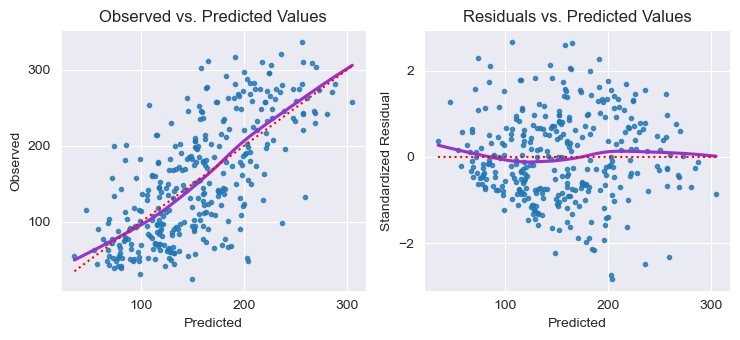

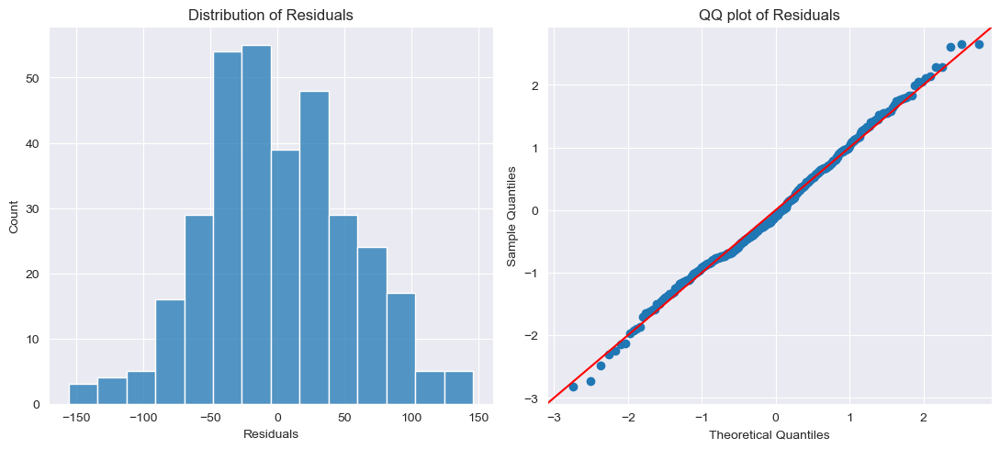

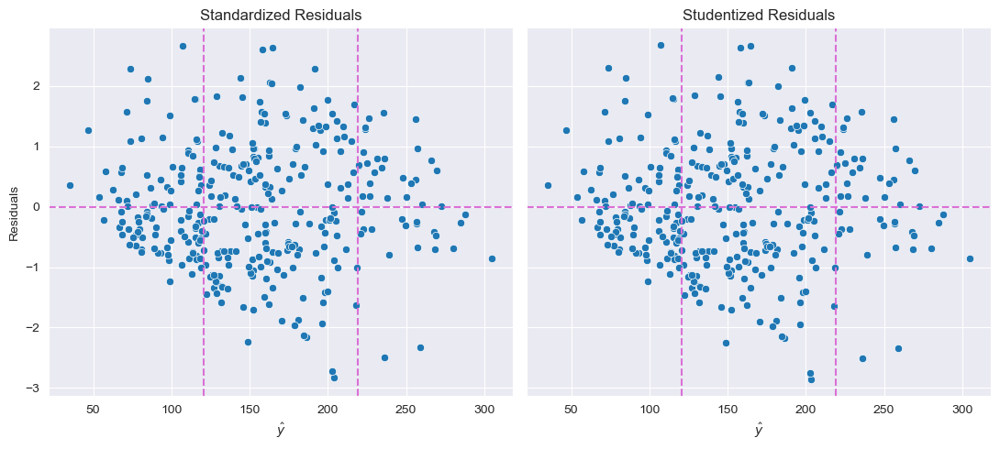

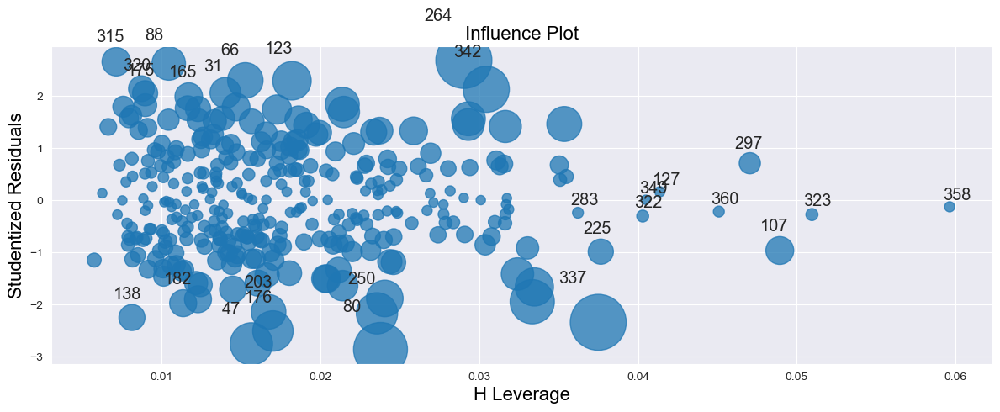

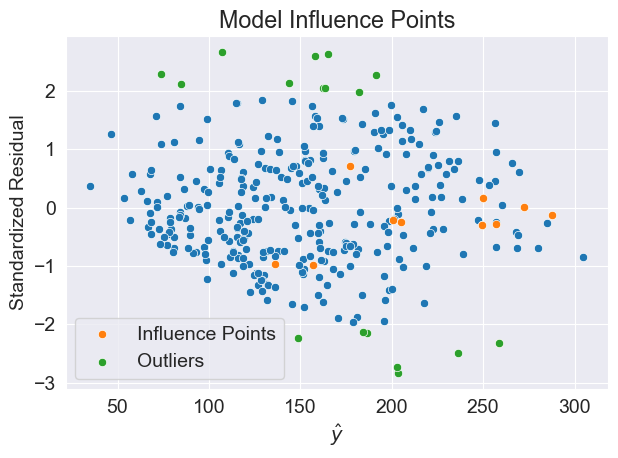

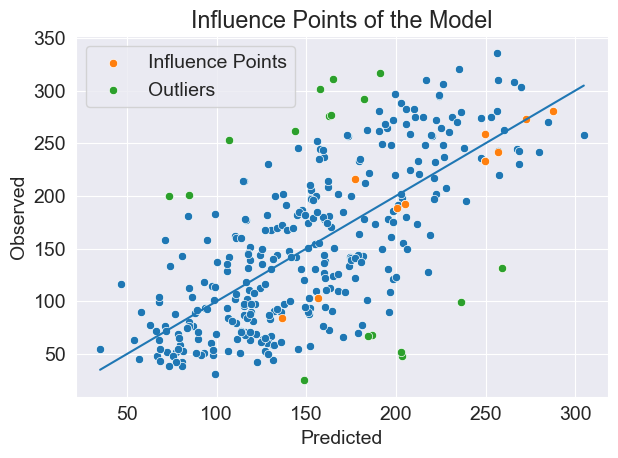

In [25]:
formula = 'Y ~ BMI + BP + S1 + S5 + Male'
model = smf.ols(formula, Xy_train).fit()
print(model.summary2())

resid = model.resid
pred = model.fittedvalues

plt.rc('font',size=10)
fig, ax = linearity_test(model, y_train)
fig.tight_layout()

fig, axs = plot_resid_dist_qqplot(model)

print(f'\nResiduals Normal Test result p-value: {stats.normaltest(resid).pvalue}\n')

influence = model.get_influence()
standard_resid = influence.resid_studentized_internal
student_resid = influence.resid_studentized_external

fig, (ax1, ax2) = plot_stand_stud_resid(model)

fig, ax = plt.subplots(figsize=(12,5))
smg.influence_plot(model, ax=ax)
fig.tight_layout()

infpts = Xy_train[influence.hat_matrix_diag > 2 * (model.df_model + 1)/model.nobs].index
alpha=0.05
outliers = Xy_train[abs(influence.resid_studentized) > stats.t.ppf(1-alpha/2, df=model.df_resid)].index
pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})

plt.rc('font',size=14)
fig, ax = plt.subplots()
sns.scatterplot(x=model.predict(), y=standard_resid, ax=ax)
sns.scatterplot(x=pred_df.loc[infpts]['pred'], y=pred_df.loc[infpts]['stand_res'], ax=ax, label='Influence Points')
sns.scatterplot(x=pred_df.loc[outliers]['pred'], y=pred_df.loc[outliers]['stand_res'], ax=ax, label='Outliers')
ax.set_title('Model Influence Points')
ax.set_xlabel('$\hat{y}$')
ax.set_ylabel('Standardized Residual')
fig.tight_layout()

fig, ax = plt.subplots()
sns.scatterplot(x=model.fittedvalues, y=y_train, ax=ax)
sns.scatterplot(x=pred[infpts], y=y_train[infpts], ax=ax, label='Influence Points')
sns.scatterplot(x=pred[outliers], y=y_train[outliers], ax=ax, label='Outliers')
sns.lineplot(x=model.fittedvalues, y=model.fittedvalues, ax=ax)
ax.set_title('Influence Points of the Model')
ax.set_xlabel('Predicted')
ax.set_ylabel('Observed')
fig.tight_layout()

_, Xdm = dmatrices(formula, data=Xy_train, return_type='dataframe')
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(Xdm.values, ii) for ii in range(Xdm.shape[1])]
vif['features'] = Xdm.columns
print(vif)

Without S2 the multicolinearity is fine but the $R_a^2$, AIC, and BIC got worse.

### Add some higher order terms

In [26]:
# I initially added all 2nd order terms and then did backward regression. One by one the 2nd order terms were removed until all were gone.
formula = 'Y ~ AGE + BMI + BP + S1 + S2 + S5 + S6 + Male + I(AGE**2) + I(S6**2)'
model = smf.ols(formula, Xy_train).fit()
print(model.summary2())

                 Results: Ordinary least squares
Model:              OLS              Adj. R-squared:     0.506    
Dependent Variable: Y                AIC:                3616.6768
Date:               2023-08-21 20:27 BIC:                3658.5663
No. Observations:   333              Log-Likelihood:     -1797.3  
Df Model:           10               F-statistic:        34.96    
Df Residuals:       322              Prob (F-statistic): 8.96e-46 
R-squared:          0.521            Scale:              2952.9   
------------------------------------------------------------------
                Coef.   Std.Err.    t    P>|t|    [0.025   0.975] 
------------------------------------------------------------------
Intercept       16.1992 151.5263  0.1069 0.9149 -281.9073 314.3058
AGE             -2.9537   1.4151 -2.0872 0.0377   -5.7378  -0.1696
BMI              5.2541   0.8276  6.3490 0.0000    3.6260   6.8822
BP               1.2968   0.2603  4.9820 0.0000    0.7847   1.8088
S1           

In [27]:
# S6 is the only variable not significant, but cant remove with out removing S6^2, lets see what that does
formula = 'Y ~ AGE + BMI + BP + S1 + S2 + S5 + S6 + Male + I(AGE**2)'
model = smf.ols(formula, Xy_train).fit()
print(model.summary2())

                 Results: Ordinary least squares
Model:              OLS              Adj. R-squared:     0.500    
Dependent Variable: Y                AIC:                3619.2651
Date:               2023-08-21 20:27 BIC:                3657.3465
No. Observations:   333              Log-Likelihood:     -1799.6  
Df Model:           9                F-statistic:        37.94    
Df Residuals:       323              Prob (F-statistic): 1.23e-45 
R-squared:          0.514            Scale:              2984.6   
------------------------------------------------------------------
               Coef.   Std.Err.    t    P>|t|    [0.025    0.975] 
------------------------------------------------------------------
Intercept    -291.7801  41.7986 -6.9806 0.0000 -374.0120 -209.5481
AGE            -3.1034   1.4209 -2.1841 0.0297   -5.8989   -0.3080
BMI             5.2797   0.8319  6.3466 0.0000    3.6431    6.9163
BP              1.2795   0.2616  4.8918 0.0000    0.7649    1.7940
S1           

In [28]:
# Ra^2 and AIC got worse, BIC got better, S6 still not significant, will remove next
formula = 'Y ~ AGE + BMI + BP + S1 + S2 + S5 + Male + I(AGE**2)'
model = smf.ols(formula, Xy_train).fit()
print(model.summary2())

                 Results: Ordinary least squares
Model:              OLS              Adj. R-squared:     0.497    
Dependent Variable: Y                AIC:                3620.4634
Date:               2023-08-21 20:27 BIC:                3654.7367
No. Observations:   333              Log-Likelihood:     -1801.2  
Df Model:           8                F-statistic:        42.02    
Df Residuals:       324              Prob (F-statistic): 8.38e-46 
R-squared:          0.509            Scale:              3004.1   
------------------------------------------------------------------
               Coef.   Std.Err.    t    P>|t|    [0.025    0.975] 
------------------------------------------------------------------
Intercept    -275.7195  40.9299 -6.7364 0.0000 -356.2413 -195.1977
AGE            -2.8444   1.4179 -2.0060 0.0457   -5.6340   -0.0549
BMI             5.4526   0.8288  6.5789 0.0000    3.8221    7.0832
BP              1.3274   0.2610  5.0859 0.0000    0.8139    1.8408
S1           

This is the first one where the all remaining variables are significant. It has the lowest BIC so far, out of those with 2nd order terms

                 Results: Ordinary least squares
Model:              OLS              Adj. R-squared:     0.497    
Dependent Variable: Y                AIC:                3620.4634
Date:               2023-08-21 20:27 BIC:                3654.7367
No. Observations:   333              Log-Likelihood:     -1801.2  
Df Model:           8                F-statistic:        42.02    
Df Residuals:       324              Prob (F-statistic): 8.38e-46 
R-squared:          0.509            Scale:              3004.1   
------------------------------------------------------------------
               Coef.   Std.Err.    t    P>|t|    [0.025    0.975] 
------------------------------------------------------------------
Intercept    -275.7195  40.9299 -6.7364 0.0000 -356.2413 -195.1977
AGE            -2.8444   1.4179 -2.0060 0.0457   -5.6340   -0.0549
BMI             5.4526   0.8288  6.5789 0.0000    3.8221    7.0832
BP              1.3274   0.2610  5.0859 0.0000    0.8139    1.8408
S1           

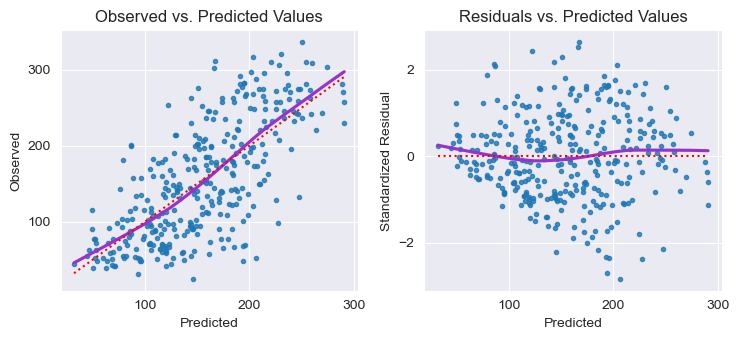

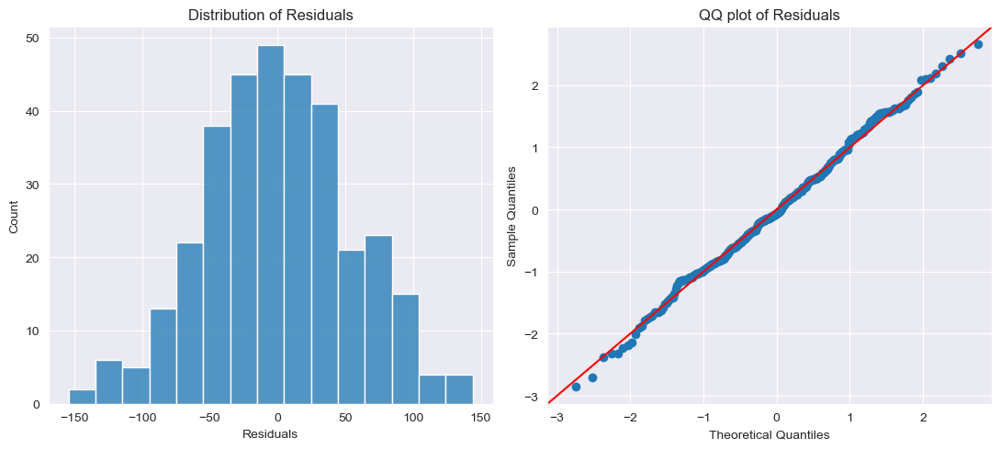

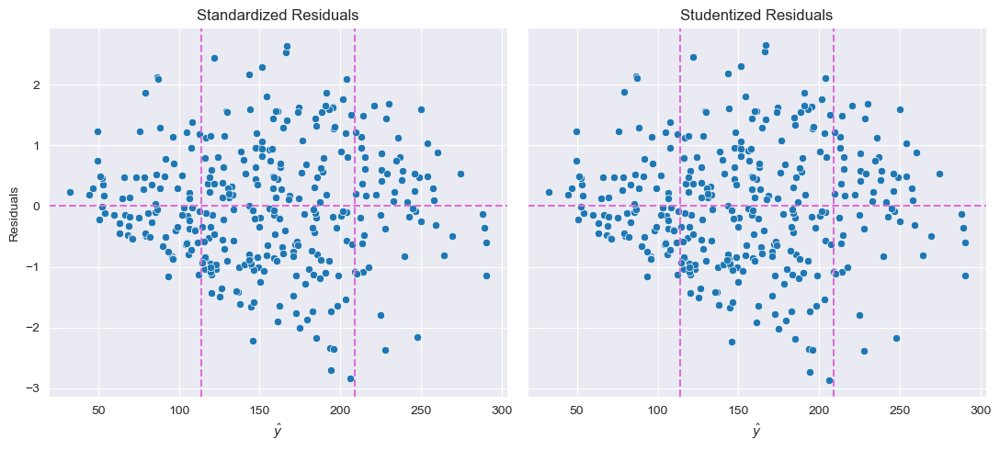

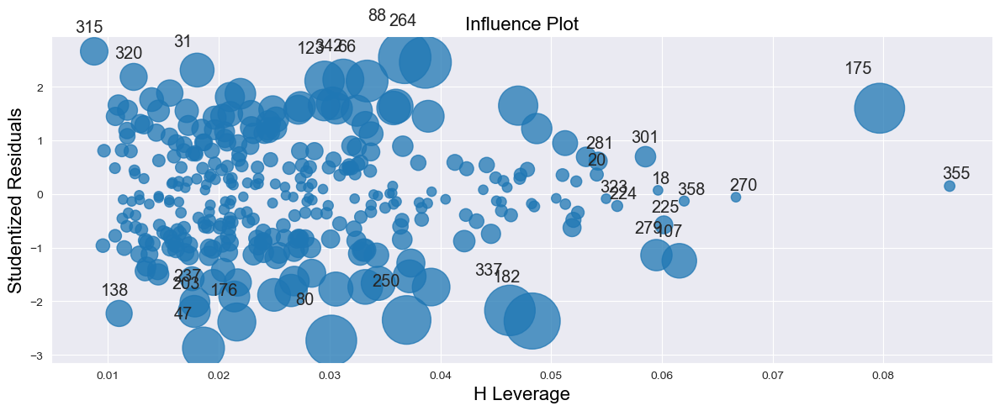

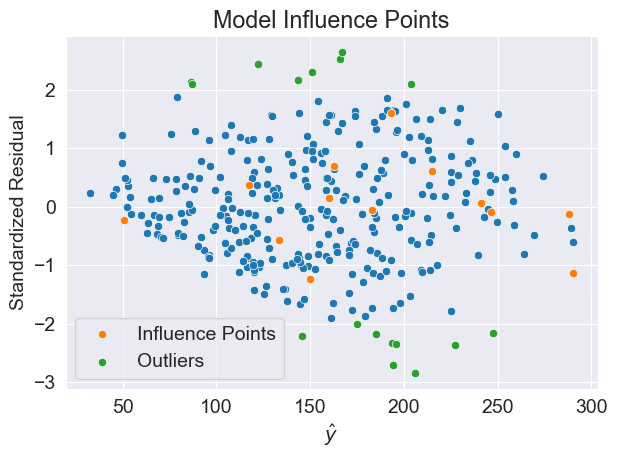

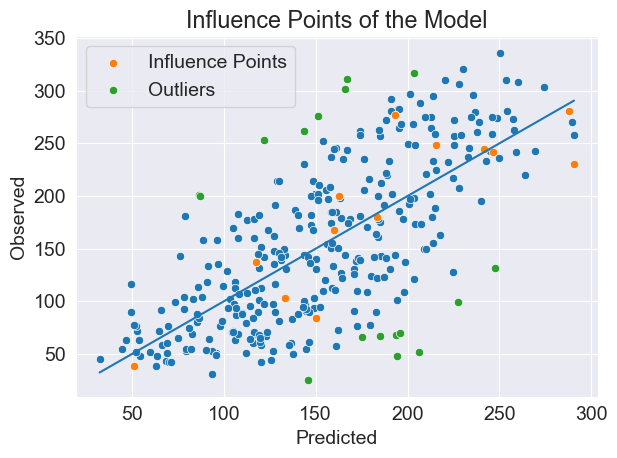

In [29]:
formula = 'Y ~ AGE + BMI + BP + S1 + S2 + S5 + Male + I(AGE**2)'
model = smf.ols(formula, Xy_train).fit()
print(model.summary2())

resid = model.resid
pred = model.fittedvalues

plt.rc('font',size=10)
fig, ax = linearity_test(model, y_train)
fig.tight_layout()

fig, axs = plot_resid_dist_qqplot(model)

print(f'\nResiduals Normal Test result p-value: {stats.normaltest(resid).pvalue}\n')

influence = model.get_influence()
standard_resid = influence.resid_studentized_internal
student_resid = influence.resid_studentized_external

fig, (ax1, ax2) = plot_stand_stud_resid(model)

fig, ax = plt.subplots(figsize=(12,5))
smg.influence_plot(model, ax=ax)
fig.tight_layout()

infpts = Xy_train[influence.hat_matrix_diag > 2 * (model.df_model + 1)/model.nobs].index
alpha=0.05
outliers = Xy_train[abs(influence.resid_studentized) > stats.t.ppf(1-alpha/2, df=model.df_resid)].index
pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})

plt.rc('font',size=14)
fig, ax = plt.subplots()
sns.scatterplot(x=model.predict(), y=standard_resid, ax=ax)
sns.scatterplot(x=pred_df.loc[infpts]['pred'], y=pred_df.loc[infpts]['stand_res'], ax=ax, label='Influence Points')
sns.scatterplot(x=pred_df.loc[outliers]['pred'], y=pred_df.loc[outliers]['stand_res'], ax=ax, label='Outliers')
ax.set_title('Model Influence Points')
ax.set_xlabel('$\hat{y}$')
ax.set_ylabel('Standardized Residual')
fig.tight_layout()

fig, ax = plt.subplots()
sns.scatterplot(x=model.fittedvalues, y=y_train, ax=ax)
sns.scatterplot(x=pred[infpts], y=y_train[infpts], ax=ax, label='Influence Points')
sns.scatterplot(x=pred[outliers], y=y_train[outliers], ax=ax, label='Outliers')
sns.lineplot(x=model.fittedvalues, y=model.fittedvalues, ax=ax)
ax.set_title('Influence Points of the Model')
ax.set_xlabel('Predicted')
ax.set_ylabel('Observed')
fig.tight_layout()

_, Xdm = dmatrices(formula, data=Xy_train, return_type='dataframe')
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(Xdm.values, ii) for ii in range(Xdm.shape[1])]
vif['features'] = Xdm.columns
print(vif)

### What about interaction terms
I am going to add interaction terms to the current model with forward selection.

In [30]:
def get_2_interaction_terms(formula):
    target = formula.split('~')[0] 
    terms = formula.split('~')[1].replace(' ','').split('+')
    new_terms = []
    for ii in range(len(terms)):
        for jj in range(ii+1,len(terms)):
            new_terms.append(f'{terms[ii]}:{terms[jj]}')
    return new_terms

In [31]:
# get interaction terms
formula = 'Y ~ AGE + BMI + BP + S1 + S2 + S5 + Male + I(AGE**2)'
terms_to_add = get_2_interaction_terms(formula)


In [32]:
formula = 'Y ~ AGE + BMI + BP + S1 + S2 + S5 + Male + I(AGE**2)'
model = smf.ols(formula, Xy_train).fit()
print('  R2a      AIC       BIC')
print(f'{model.rsquared_adj:.3f}   {model.aic:.2f}   {model.bic:.2f}')
print(f'\nhighest p-value term: {model.pvalues[model.pvalues==model.pvalues.max()]}')

print('Term            :    R2a      AIC       BIC')
for next_term in terms_to_add:
    model = smf.ols(formula + '+' + next_term, data=Xy_train).fit()
    print(f'{next_term:15} : {model.rsquared_adj:7.4f}   {model.aic:7.3f}   {model.bic:7.3f}')

  R2a      AIC       BIC
0.497   3620.46   3654.74

highest p-value term: I(AGE ** 2)    0.048943
dtype: float64
Term            :    R2a      AIC       BIC
AGE:BMI         :  0.4968   3621.607   3659.688
AGE:BP          :  0.4982   3620.652   3658.733
AGE:S1          :  0.4955   3622.455   3660.536
AGE:S2          :  0.4956   3622.372   3660.453
AGE:S5          :  0.4977   3621.001   3659.082
AGE:Male        :  0.5100   3612.726   3650.807
AGE:I(AGE**2)   :  0.5026   3617.744   3655.826
BMI:BP          :  0.5077   3614.311   3652.393
BMI:S1          :  0.4956   3622.394   3660.476
BMI:S2          :  0.4956   3622.421   3660.503
BMI:S5          :  0.4979   3620.910   3658.991
BMI:Male        :  0.5029   3617.547   3655.628
BMI:I(AGE**2)   :  0.4961   3622.050   3660.132
BP:S1           :  0.4960   3622.119   3660.200
BP:S2           :  0.4960   3622.133   3660.214
BP:S5           :  0.4972   3621.348   3659.429
BP:Male         :  0.5041   3616.717   3654.799
BP:I(AGE**2)    :  0.4973  

In [33]:
# used this cell interatively to add terms that improved the BIC
add_term = 'BMI:BP'
formula += f' + {add_term}'
terms_to_add.remove(add_term)
model = smf.ols(formula, Xy_train).fit()
print('  R2a      AIC       BIC')
print(f'{model.rsquared_adj:.3f}   {model.aic:.2f}   {model.bic:.2f}')
print(f'\nhighest p-value term: {model.pvalues[model.pvalues==model.pvalues.max()]}')
print('Term            :    R2a      AIC       BIC')
for next_term in terms_to_add:
    model = smf.ols(formula + '+' + next_term, data=Xy_train).fit()
    print(f'{next_term:15} : {model.rsquared_adj:7.4f}   {model.aic:7.3f}   {model.bic:7.3f}')

  R2a      AIC       BIC
0.508   3614.31   3652.39

highest p-value term: Intercept    0.61427
dtype: float64
Term            :    R2a      AIC       BIC
AGE:BMI         :  0.5062   3616.310   3658.200
AGE:BP          :  0.5082   3614.927   3656.816
AGE:S1          :  0.5062   3616.272   3658.162
AGE:S2          :  0.5065   3616.091   3657.980
AGE:S5          :  0.5080   3615.113   3657.002
AGE:Male        :  0.5209   3606.270   3648.159
AGE:I(AGE**2)   :  0.5132   3611.545   3653.435
BMI:S1          :  0.5062   3616.284   3658.174
BMI:S2          :  0.5062   3616.311   3658.200
BMI:S5          :  0.5063   3616.222   3658.111
BMI:Male        :  0.5093   3614.207   3656.097
BMI:I(AGE**2)   :  0.5063   3616.249   3658.139
BP:S1           :  0.5062   3616.301   3658.190
BP:S2           :  0.5062   3616.309   3658.198
BP:S5           :  0.5062   3616.296   3658.185
BP:Male         :  0.5123   3612.128   3654.018
BP:I(AGE**2)    :  0.5076   3615.343   3657.232
S1:S2           :  0.5063   36

BIC no longer improves so we will check the current model

In [34]:
formula

'Y ~ AGE + BMI + BP + S1 + S2 + S5 + Male + I(AGE**2) + BMI:BP'

In [35]:
model = smf.ols(formula, Xy_train).fit()
print(model.summary2())

                 Results: Ordinary least squares
Model:              OLS              Adj. R-squared:     0.508    
Dependent Variable: Y                AIC:                3614.3113
Date:               2023-08-21 20:27 BIC:                3652.3928
No. Observations:   333              Log-Likelihood:     -1797.2  
Df Model:           9                F-statistic:        39.04    
Df Residuals:       323              Prob (F-statistic): 1.17e-46 
R-squared:          0.521            Scale:              2940.5   
------------------------------------------------------------------
                Coef.   Std.Err.    t    P>|t|    [0.025   0.975] 
------------------------------------------------------------------
Intercept       63.9109 126.6875  0.5045 0.6143 -185.3260 313.1478
AGE             -2.4868   1.4085 -1.7655 0.0784   -5.2578   0.2843
BMI             -7.7916   4.7524 -1.6395 0.1021  -17.1412   1.5580
BP              -2.4225   1.3503 -1.7940 0.0737   -5.0790   0.2340
S1           

The AGE**2 term is no longer significant, lets remove it and see what happens

In [36]:
formula = 'Y ~ AGE + BMI + BP + S1 + S2 + S5 + Male + AGE:Male + BMI:BP'
model = smf.ols(formula, Xy_train).fit()
print(model.summary2())

                 Results: Ordinary least squares
Model:              OLS              Adj. R-squared:     0.519    
Dependent Variable: Y                AIC:                3606.2486
Date:               2023-08-21 20:27 BIC:                3644.3300
No. Observations:   333              Log-Likelihood:     -1793.1  
Df Model:           9                F-statistic:        40.88    
Df Residuals:       323              Prob (F-statistic): 2.52e-48 
R-squared:          0.533            Scale:              2870.2   
-------------------------------------------------------------------
            Coef.    Std.Err.     t     P>|t|     [0.025    0.975] 
-------------------------------------------------------------------
Intercept   43.2729  123.7008   0.3498  0.7267  -200.0881  286.6338
AGE         -0.6850    0.3224  -2.1249  0.0344    -1.3192   -0.0508
BMI         -8.2128    4.6824  -1.7540  0.0804   -17.4246    0.9990
BP          -2.5265    1.3314  -1.8976  0.0586    -5.1458    0.0928
S1    

BIC decreased and the interaction terms are still significant. BMI and BP are no longer significant but we can't remove them without taking out the interaction terms. We'll keep this one to compare.


Residuals Normal Test result p-value: 0.6400455239966816

           VIF   features
0  1775.336321  Intercept
1     2.177392        AGE
2    50.026983        BMI
3    38.555788         BP
4     8.209071         S1
5     6.966735         S2
6     2.105082         S5
7    15.239140       Male
8    16.921478   AGE:Male
9   118.526448     BMI:BP


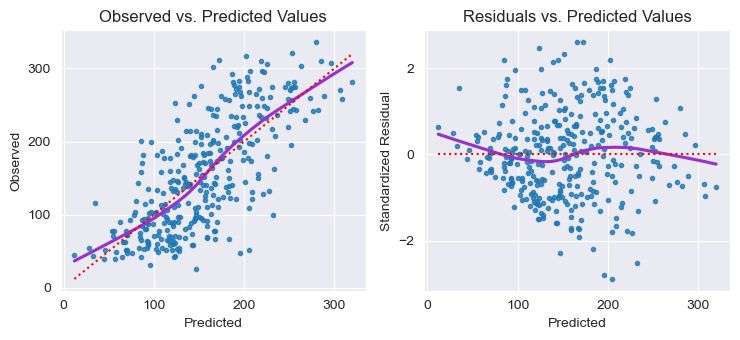

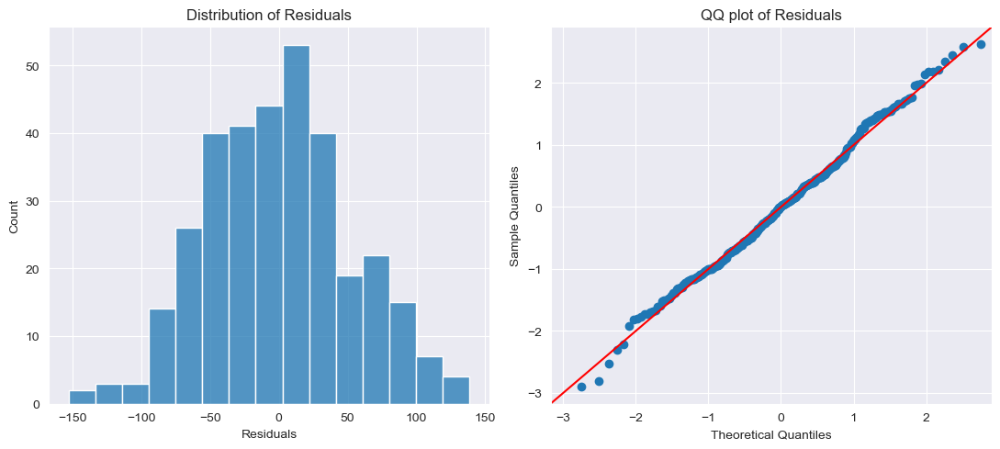

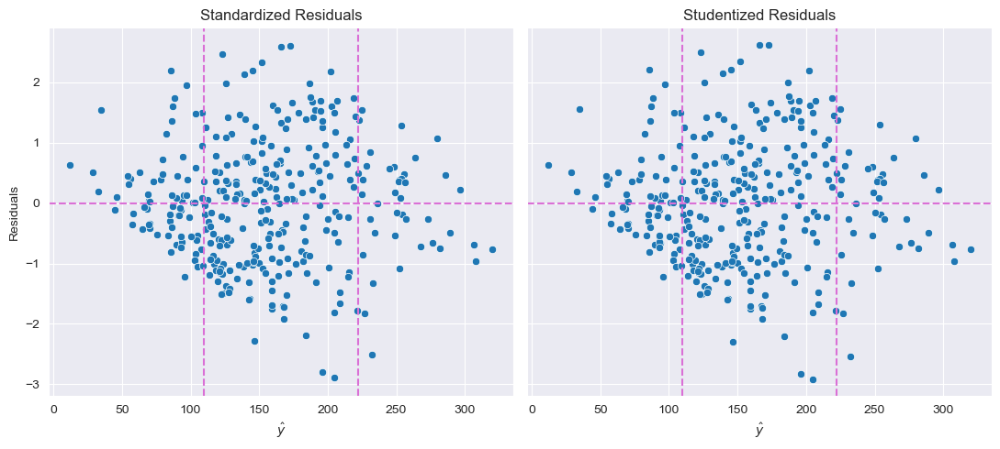

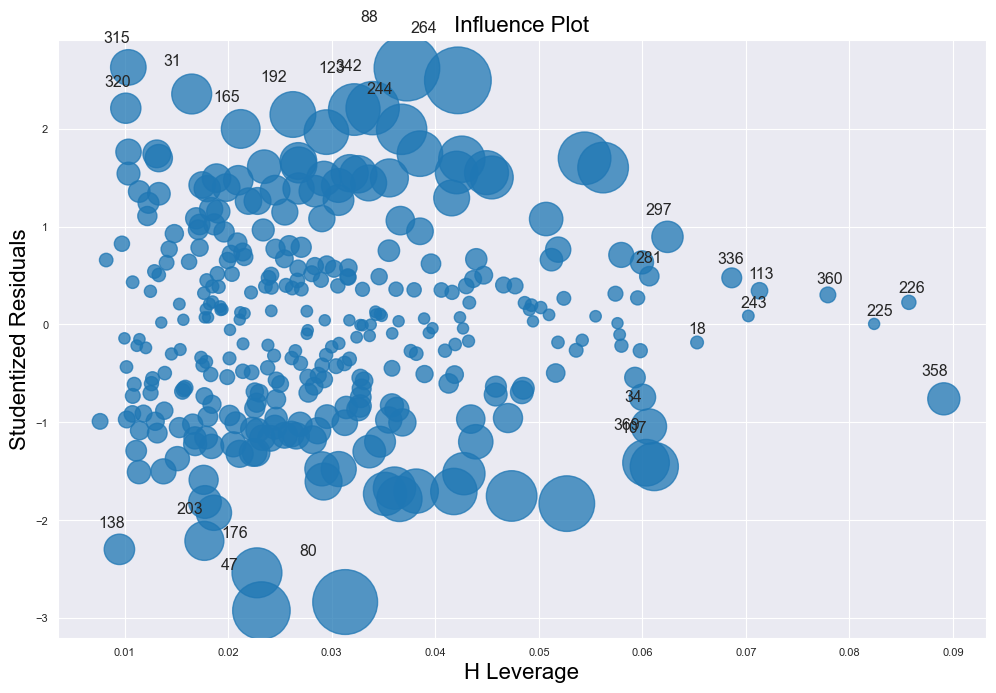

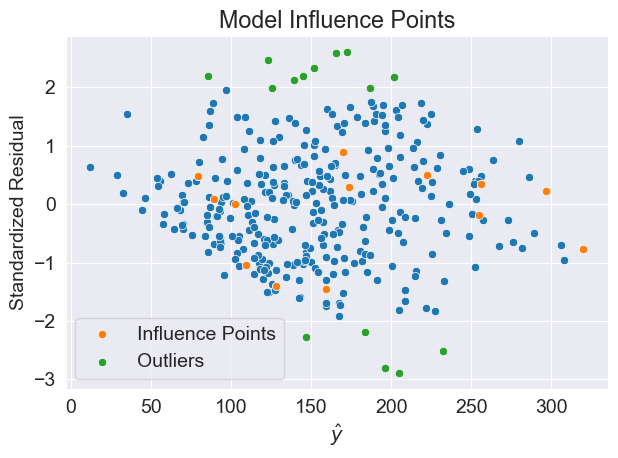

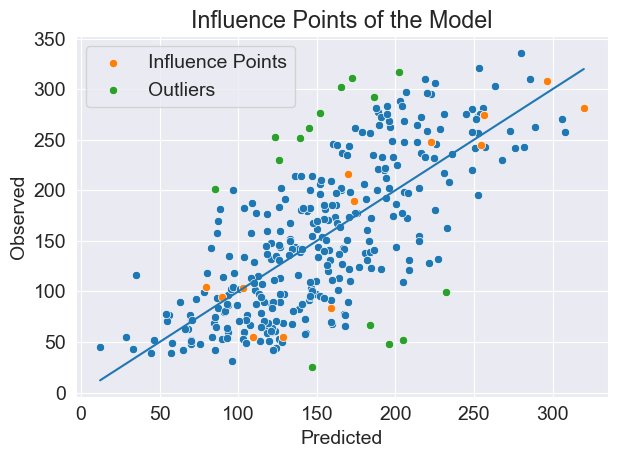

In [37]:
resid = model.resid
pred = model.fittedvalues

# check residual mean and variance
plt.rc('font',size=10)
fig, ax = linearity_test(model, y_train)
fig.tight_layout()

fig, axs = plot_resid_dist_qqplot(model)

print(f'\nResiduals Normal Test result p-value: {stats.normaltest(resid).pvalue}\n')

influence = model.get_influence()
standard_resid = influence.resid_studentized_internal
student_resid = influence.resid_studentized_external

fig, (ax1, ax2) = plot_stand_stud_resid(model)

plt.rc('font',size=8)
fig, ax = plt.subplots(figsize=(10,7))
smg.influence_plot(model, ax=ax)
plt.tight_layout()

# create a dataframe to index the influence points for plotting
pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})
infpts = Xy_train[influence.hat_matrix_diag > 2 * (model.df_model + 1)/model.nobs].index
alpha=0.05
outliers = Xy_train[abs(influence.resid_studentized) > stats.t.ppf(1-alpha/2, df=model.df_resid)].index
pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})

plt.rc('font',size=14)
fig, ax = plt.subplots()
sns.scatterplot(x=model.predict(), y=standard_resid, ax=ax)
sns.scatterplot(x=pred_df.loc[infpts]['pred'], y=pred_df.loc[infpts]['stand_res'], ax=ax, label='Influence Points')
sns.scatterplot(x=pred_df.loc[outliers]['pred'], y=pred_df.loc[outliers]['stand_res'], ax=ax, label='Outliers')
ax.set_title('Model Influence Points')
ax.set_xlabel('$\hat{y}$')
ax.set_ylabel('Standardized Residual')
fig.tight_layout()

fig, ax = plt.subplots()
sns.scatterplot(x=model.fittedvalues, y=y_train, ax=ax)
sns.scatterplot(x=pred[infpts], y=y_train[infpts], ax=ax, label='Influence Points')
sns.scatterplot(x=pred[outliers], y=y_train[outliers], ax=ax, label='Outliers')
sns.lineplot(x=model.fittedvalues, y=model.fittedvalues, ax=ax)
ax.set_title('Influence Points of the Model')
ax.set_xlabel('Predicted')
ax.set_ylabel('Observed')
fig.tight_layout()

# check multicolinearity (Variance Inflation Factors)
_, Xdm = dmatrices(formula, data=Xy_train, return_type='dataframe')
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(Xdm.values, ii) \
              for ii in range(Xdm.shape[1])]
vif['features'] = Xdm.columns
print(vif)

The intercept is no longer significant in this model, lets remove it to compare.

                        Results: Ordinary least squares
Model:                  OLS              Adj. R-squared (uncentered): 0.904    
Dependent Variable:     Y                AIC:                         3604.3747
Date:                   2023-08-21 20:27 BIC:                         3638.6480
No. Observations:       333              Log-Likelihood:              -1793.2  
Df Model:               9                F-statistic:                 348.0    
Df Residuals:           324              Prob (F-statistic):          1.01e-160
R-squared (uncentered): 0.906            Scale:                       2862.4   
----------------------------------------------------------------------------------
                 Coef.      Std.Err.       t       P>|t|       [0.025      0.975] 
----------------------------------------------------------------------------------
AGE              -0.6952      0.3206    -2.1683    0.0309      -1.3260     -0.0644
BMI              -6.6417      1.3223    -5.0227    0

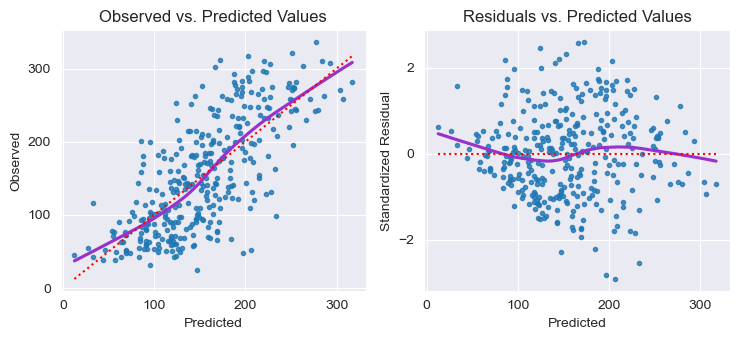

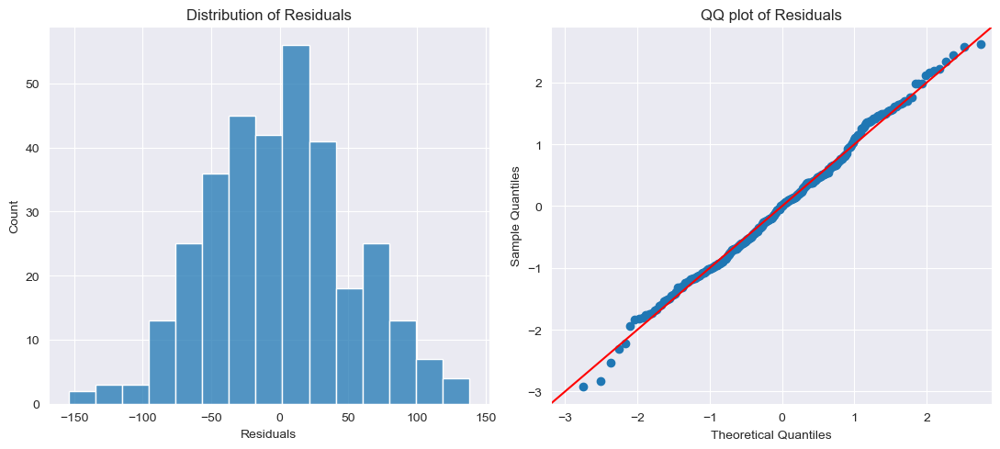

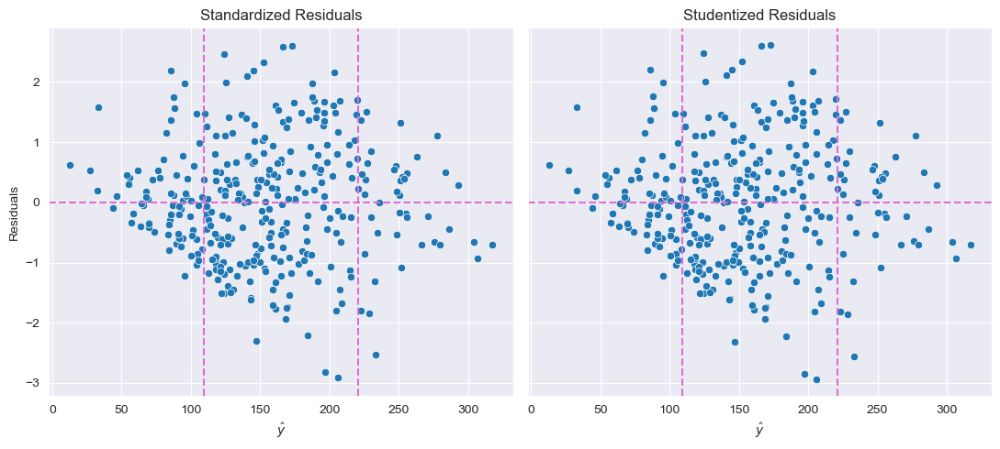

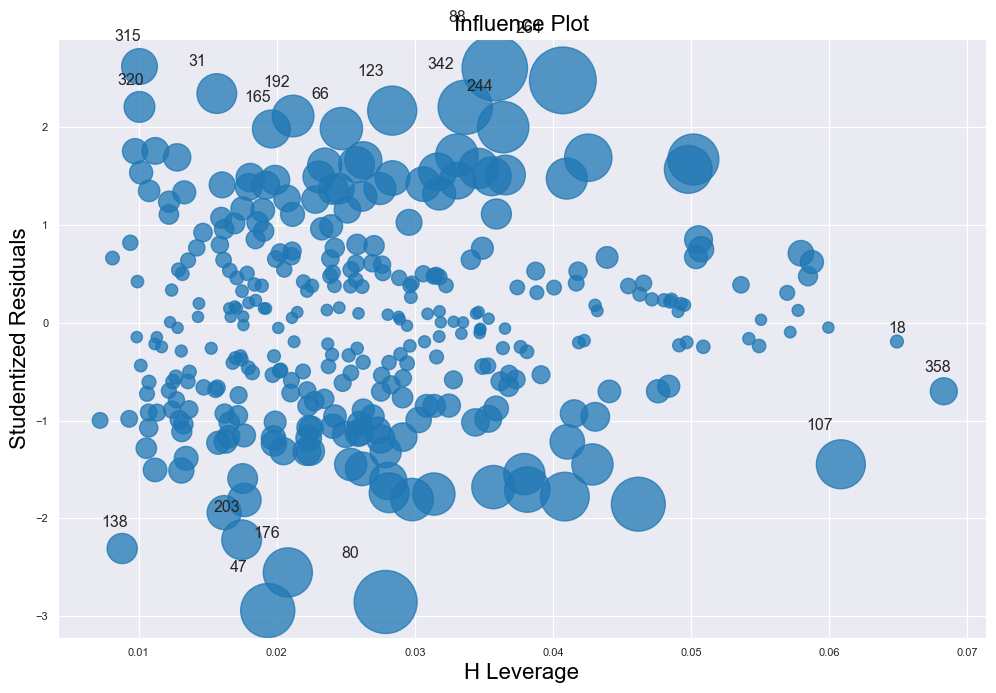

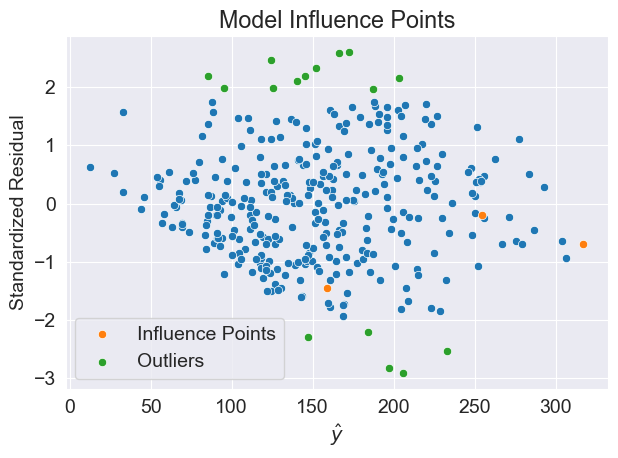

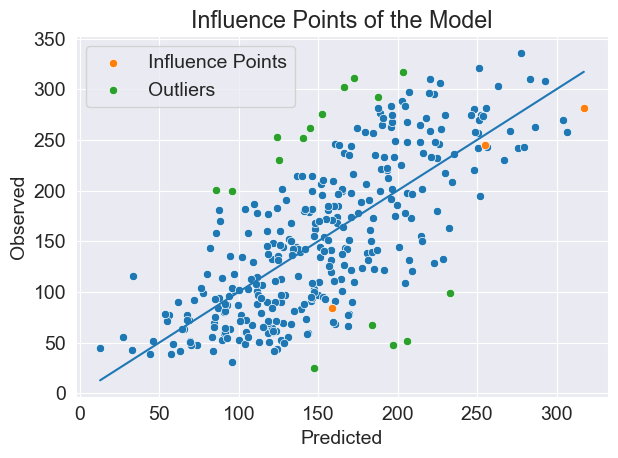

In [38]:
# remove the intercept term since it is not significant
formula = 'Y ~ AGE + BMI + BP + S1 + S2 + S5 + Male + AGE:Male + BMI:BP - 1'
model = smf.ols(formula, Xy_train).fit()
print(model.summary2())

resid = model.resid
pred = model.fittedvalues

# check residual mean and variance
plt.rc('font',size=10)
fig, ax = linearity_test(model, y_train)
fig.tight_layout()

fig, axs = plot_resid_dist_qqplot(model)

print(f'\nResiduals Normal Test result p-value: {stats.normaltest(resid).pvalue}\n')

influence = model.get_influence()
standard_resid = influence.resid_studentized_internal
student_resid = influence.resid_studentized_external

fig, (ax1, ax2) = plot_stand_stud_resid(model)

plt.rc('font',size=8)
fig, ax = plt.subplots(figsize=(10,7))
smg.influence_plot(model, ax=ax)
plt.tight_layout()

# create a dataframe to index the influence points for plotting
pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})
infpts = Xy_train[influence.hat_matrix_diag > 2 * (model.df_model + 1)/model.nobs].index
alpha=0.05
outliers = Xy_train[abs(influence.resid_studentized) > stats.t.ppf(1-alpha/2, df=model.df_resid)].index
pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})

plt.rc('font',size=14)
fig, ax = plt.subplots()
sns.scatterplot(x=model.predict(), y=standard_resid, ax=ax)
sns.scatterplot(x=pred_df.loc[infpts]['pred'], y=pred_df.loc[infpts]['stand_res'], ax=ax, label='Influence Points')
sns.scatterplot(x=pred_df.loc[outliers]['pred'], y=pred_df.loc[outliers]['stand_res'], ax=ax, label='Outliers')
ax.set_title('Model Influence Points')
ax.set_xlabel('$\hat{y}$')
ax.set_ylabel('Standardized Residual')
fig.tight_layout()

fig, ax = plt.subplots()
sns.scatterplot(x=model.fittedvalues, y=y_train, ax=ax)
sns.scatterplot(x=pred[infpts], y=y_train[infpts], ax=ax, label='Influence Points')
sns.scatterplot(x=pred[outliers], y=y_train[outliers], ax=ax, label='Outliers')
sns.lineplot(x=model.fittedvalues, y=model.fittedvalues, ax=ax)
ax.set_title('Influence Points of the Model')
ax.set_xlabel('Predicted')
ax.set_ylabel('Observed')
fig.tight_layout()

# check multicolinearity (Variance Inflation Factors)
_, Xdm = dmatrices(formula, data=Xy_train, return_type='dataframe')
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(Xdm.values, ii) \
              for ii in range(Xdm.shape[1])]
vif['features'] = Xdm.columns
print(vif)

The BIC did improve and all variables are significant.

In [39]:
from sklearn.metrics import explained_variance_score
explained_variance_score(y_train, model.predict())

0.5323363630861362

## Try transforming data

In [40]:
yt, lamb, ci = stats.boxcox(Xy_train['Y'], alpha=0.05)
print(lamb)
print(ci)

0.39351958481558885
(0.19056793298053598, 0.6005540694657941)


In [41]:
lamb = lamb.round(3)
y_train_trans = y_train**lamb

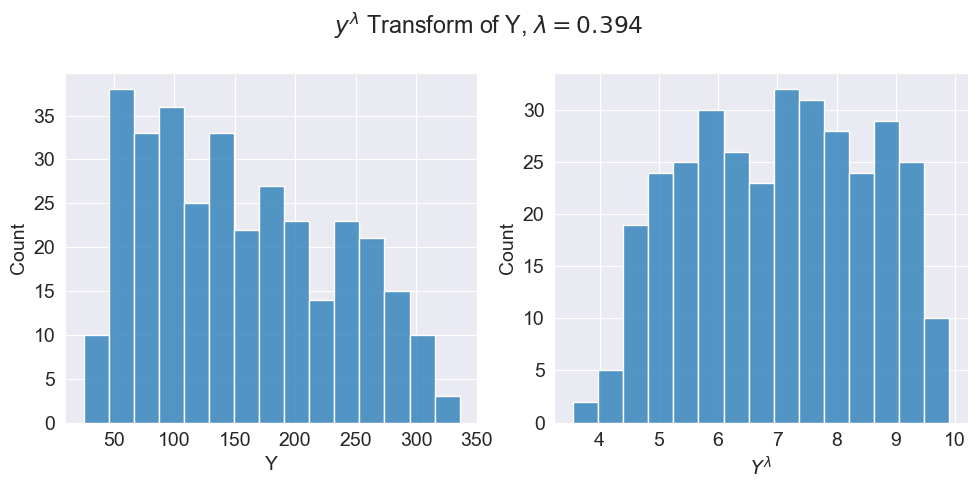

In [42]:
# see the distribution of y now
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5))
sns.histplot(y_train,bins=15, ax=ax1)
sns.histplot(y_train_trans,bins=15, ax=ax2)
fig.suptitle('$y^\lambda$ Transform of Y, $\lambda=0.394$')
ax1.set_xlabel('Y')
ax2.set_xlabel('$Y^\lambda$')
fig.tight_layout()
fig.savefig('1_transform_Y.png')

Y looks more normal than before.  
I am going to apply the transform to the current models planned for comparison and adjust from there.

                 Results: Ordinary least squares
Model:              OLS              Adj. R-squared:     0.465    
Dependent Variable: I(Y ** 0.394)    AIC:                1011.3321
Date:               2023-08-21 20:27 BIC:                1034.1810
No. Observations:   333              Log-Likelihood:     -499.67  
Df Model:           5                F-statistic:        58.71    
Df Residuals:       327              Prob (F-statistic): 1.69e-43 
R-squared:          0.473            Scale:              1.1988   
-------------------------------------------------------------------
                Coef.   Std.Err.     t     P>|t|    [0.025   0.975]
-------------------------------------------------------------------
Intercept      -2.2909    0.5994  -3.8223  0.0002  -3.4700  -1.1118
BMI             0.1079    0.0160   6.7560  0.0000   0.0765   0.1393
BP              0.0220    0.0050   4.3663  0.0000   0.0121   0.0319
S1             -0.0054    0.0021  -2.6099  0.0095  -0.0095  -0.0013
S5    

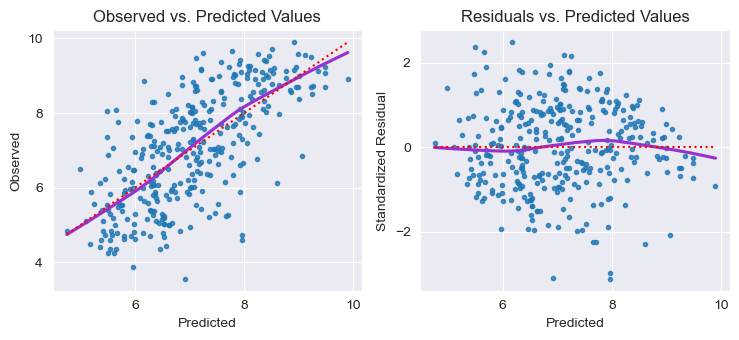

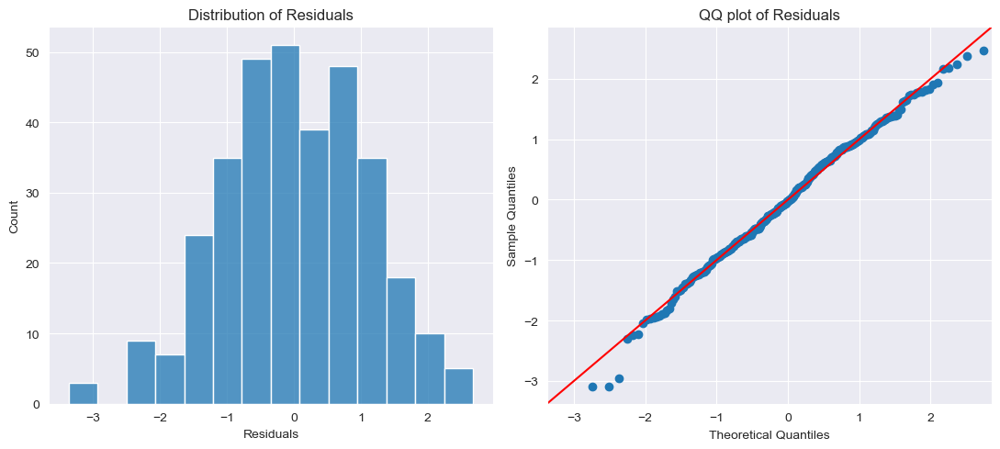

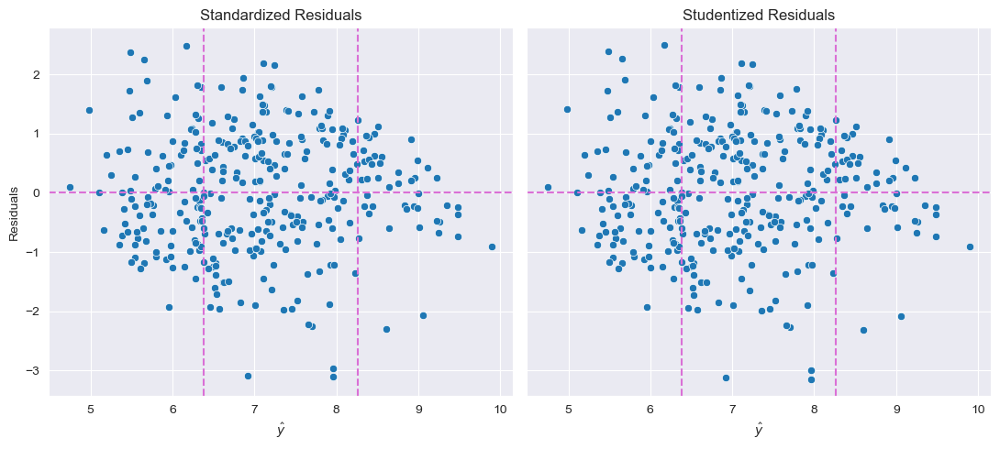

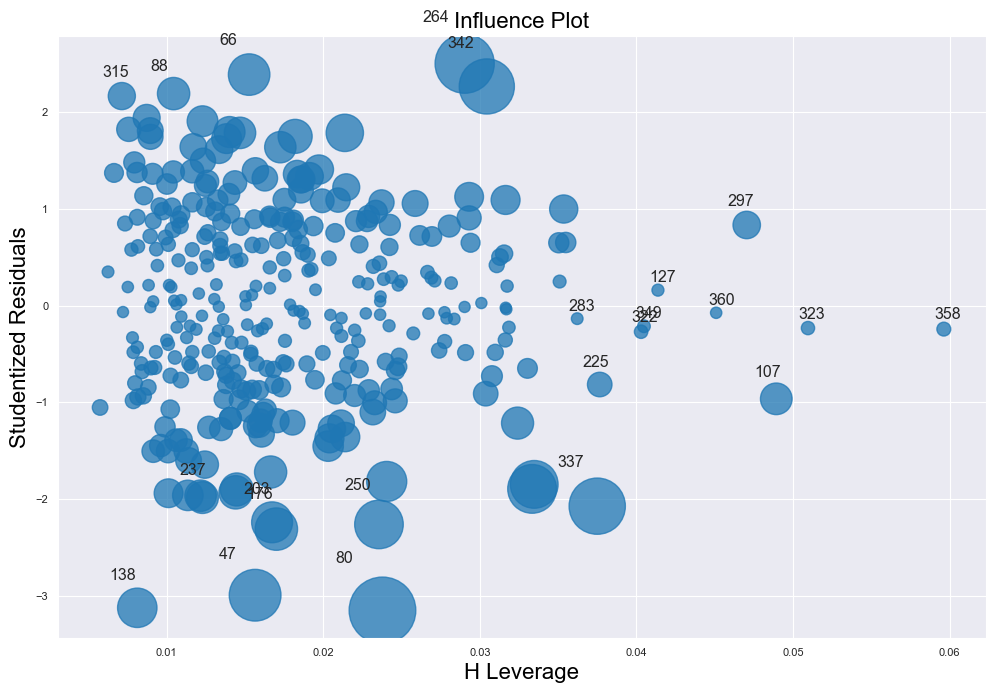

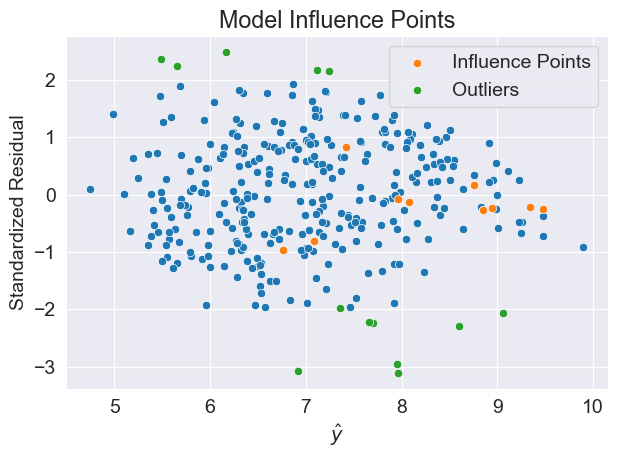

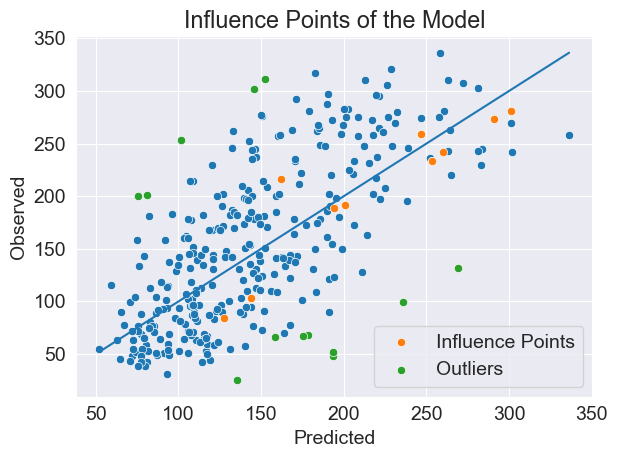

In [43]:
formula = f'I(Y**{lamb}) ~ BMI + BP + S1 + S5 + Male'
model = smf.ols(formula, Xy_train).fit()
print(model.summary2())

resid = model.resid
pred = model.fittedvalues

plt.rc('font',size=10)
fig, ax = linearity_test(model, y_train**lamb)
fig.tight_layout()

fig, axs = plot_resid_dist_qqplot(model)

print(f'\nResiduals Normal Test result p-value: {stats.normaltest(resid).pvalue}\n')

influence = model.get_influence()
standard_resid = influence.resid_studentized_internal
student_resid = influence.resid_studentized_external

fig, (ax1, ax2) = plot_stand_stud_resid(model)

plt.rc('font',size=8)
fig, ax = plt.subplots(figsize=(10,7))
smg.influence_plot(model, ax=ax)
plt.tight_layout()

pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})
infpts = Xy_train[influence.hat_matrix_diag > 2 * (model.df_model + 1)/model.nobs].index
alpha=0.05
outliers = Xy_train[abs(influence.resid_studentized) > stats.t.ppf(1-alpha/2, df=model.df_resid)].index
pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})

plt.rc('font',size=14)
fig, ax = plt.subplots()
sns.scatterplot(x=model.predict(), y=standard_resid, ax=ax)
sns.scatterplot(x=pred_df.loc[infpts]['pred'], y=pred_df.loc[infpts]['stand_res'], ax=ax, label='Influence Points')
sns.scatterplot(x=pred_df.loc[outliers]['pred'], y=pred_df.loc[outliers]['stand_res'], ax=ax, label='Outliers')
ax.set_title('Model Influence Points')
ax.set_xlabel('$\hat{y}$')
ax.set_ylabel('Standardized Residual')
fig.tight_layout()

fig, ax = plt.subplots()
sns.scatterplot(x=model.fittedvalues**(1/lamb), y=y_train, ax=ax)
sns.scatterplot(x=pred[infpts]**(1/lamb), y=y_train[infpts], ax=ax, label='Influence Points')
sns.scatterplot(x=pred[outliers]**(1/lamb), y=y_train[outliers], ax=ax, label='Outliers')
sns.lineplot(x=model.fittedvalues**(1/lamb), y=model.fittedvalues**(1/lamb), ax=ax)
ax.set_title('Influence Points of the Model')
ax.set_xlabel('Predicted')
ax.set_ylabel('Observed')
fig.tight_layout()

_, Xdm = dmatrices(formula, data=Xy_train, return_type='dataframe')
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(Xdm.values, ii) \
              for ii in range(Xdm.shape[1])]
vif['features'] = Xdm.columns
print(vif)

The $R_a^2$ went down, but the AIC and BIC improved significantly

                 Results: Ordinary least squares
Model:              OLS              Adj. R-squared:     0.483    
Dependent Variable: I(Y ** 0.394)    AIC:                1001.1165
Date:               2023-08-21 20:27 BIC:                1027.7735
No. Observations:   333              Log-Likelihood:     -493.56  
Df Model:           6                F-statistic:        52.63    
Df Residuals:       326              Prob (F-statistic): 3.74e-45 
R-squared:          0.492            Scale:              1.1591   
-------------------------------------------------------------------
                Coef.   Std.Err.     t     P>|t|    [0.025   0.975]
-------------------------------------------------------------------
Intercept      -2.3117    0.5894  -3.9222  0.0001  -3.4713  -1.1522
BMI             0.0935    0.0162   5.7593  0.0000   0.0616   0.1254
BP              0.0241    0.0050   4.8367  0.0000   0.0143   0.0340
S1             -0.0216    0.0051  -4.2665  0.0000  -0.0315  -0.0116
S2    

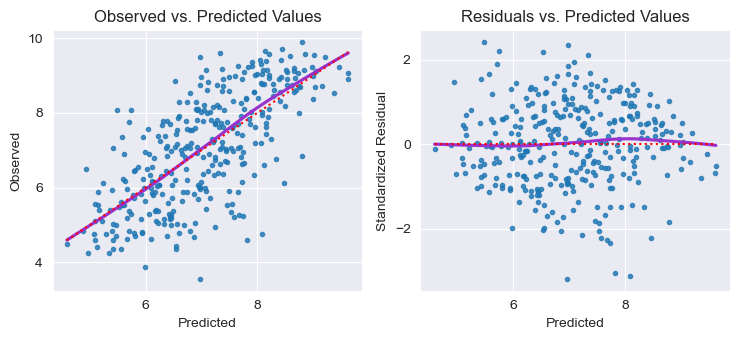

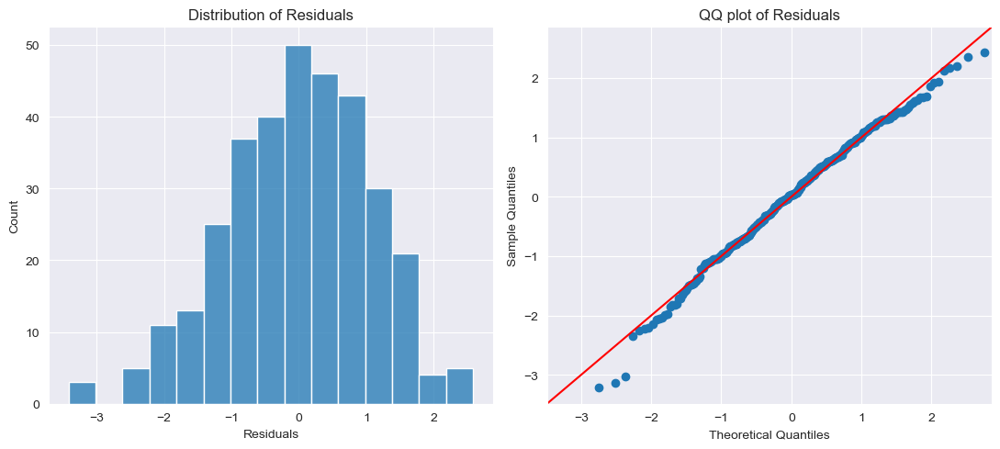

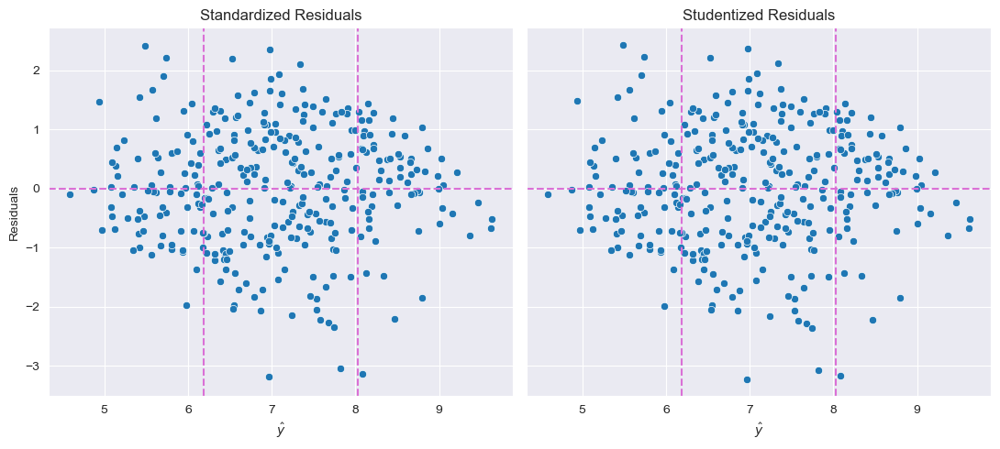

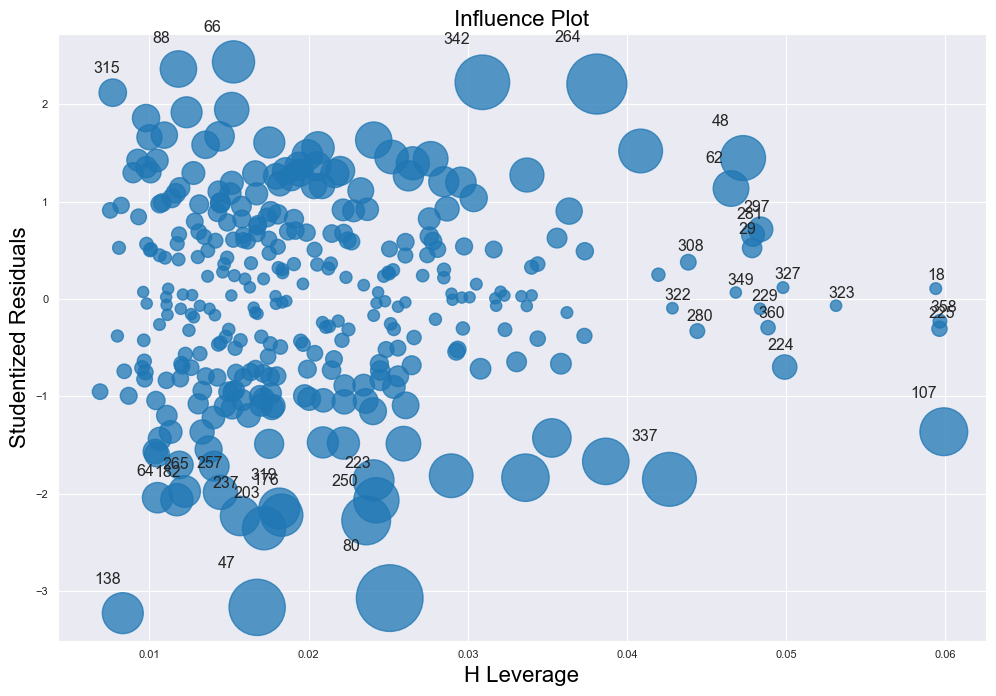

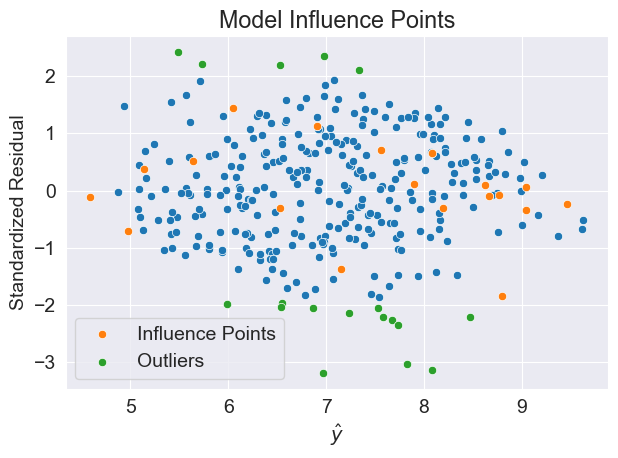

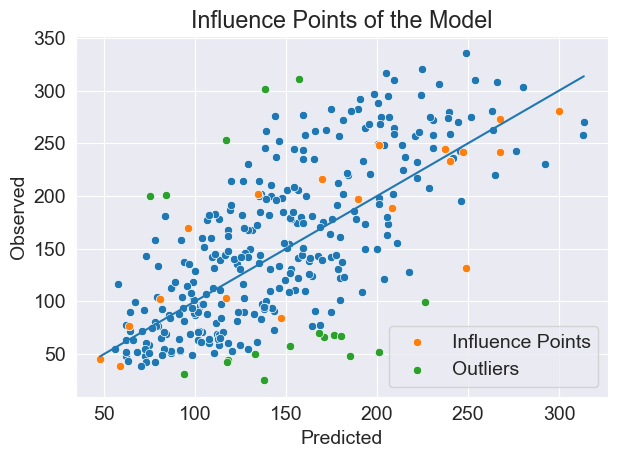

In [44]:
# add S2 term
formula = f'I(Y**{lamb}) ~ BMI + BP + S1 + S2 + S5 + Male'
model = smf.ols(formula, Xy_train).fit()
print(model.summary2())

resid = model.resid
pred = model.fittedvalues

plt.rc('font',size=10)
fig, ax = linearity_test(model, y_train**lamb)
fig.tight_layout()

fig, axs = plot_resid_dist_qqplot(model)

print(f'\nResiduals Normal Test result p-value: {stats.normaltest(resid).pvalue}\n')

influence = model.get_influence()
standard_resid = influence.resid_studentized_internal
student_resid = influence.resid_studentized_external

fig, (ax1, ax2) = plot_stand_stud_resid(model)

plt.rc('font',size=8)
fig, ax = plt.subplots(figsize=(10,7))
smg.influence_plot(model, ax=ax)
plt.tight_layout()

pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})
infpts = Xy_train[influence.hat_matrix_diag > 2 * (model.df_model + 1)/model.nobs].index
alpha=0.05
outliers = Xy_train[abs(influence.resid_studentized) > stats.t.ppf(1-alpha/2, df=model.df_resid)].index
pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})

plt.rc('font',size=14)
fig, ax = plt.subplots()
sns.scatterplot(x=model.predict(), y=standard_resid, ax=ax)
sns.scatterplot(x=pred_df.loc[infpts]['pred'], y=pred_df.loc[infpts]['stand_res'], ax=ax, label='Influence Points')
sns.scatterplot(x=pred_df.loc[outliers]['pred'], y=pred_df.loc[outliers]['stand_res'], ax=ax, label='Outliers')
ax.set_title('Model Influence Points')
ax.set_xlabel('$\hat{y}$')
ax.set_ylabel('Standardized Residual')
fig.tight_layout()

fig, ax = plt.subplots()
sns.scatterplot(x=model.fittedvalues**(1/lamb), y=y_train, ax=ax)
sns.scatterplot(x=pred[infpts]**(1/lamb), y=y_train[infpts], ax=ax, label='Influence Points')
sns.scatterplot(x=pred[outliers]**(1/lamb), y=y_train[outliers], ax=ax, label='Outliers')
sns.lineplot(x=model.fittedvalues**(1/lamb), y=model.fittedvalues**(1/lamb), ax=ax)
ax.set_title('Influence Points of the Model')
ax.set_xlabel('Predicted')
ax.set_ylabel('Observed')
fig.tight_layout()

_, Xdm = dmatrices(formula, data=Xy_train, return_type='dataframe')
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(Xdm.values, ii) \
              for ii in range(Xdm.shape[1])]
vif['features'] = Xdm.columns
print(vif)

Similar to before, including S2 improved the scores.

                 Results: Ordinary least squares
Model:              OLS              Adj. R-squared:     0.489    
Dependent Variable: I(Y ** lamb)     AIC:                998.7524 
Date:               2023-08-21 20:28 BIC:                1033.0257
No. Observations:   333              Log-Likelihood:     -490.38  
Df Model:           8                F-statistic:        40.77    
Df Residuals:       324              Prob (F-statistic): 9.50e-45 
R-squared:          0.502            Scale:              1.1442   
-------------------------------------------------------------------
                Coef.   Std.Err.     t     P>|t|    [0.025   0.975]
-------------------------------------------------------------------
Intercept      -0.9543    0.7988  -1.1947  0.2331  -2.5258   0.6172
AGE            -0.0685    0.0277  -2.4760  0.0138  -0.1230  -0.0141
BMI             0.0965    0.0162   5.9668  0.0000   0.0647   0.1283
BP              0.0244    0.0051   4.7841  0.0000   0.0143   0.0344
S1    

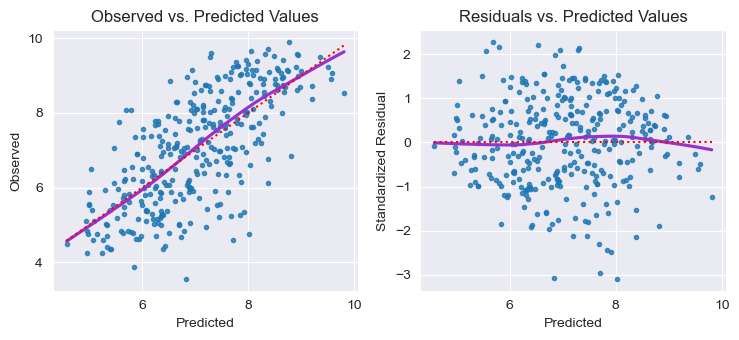

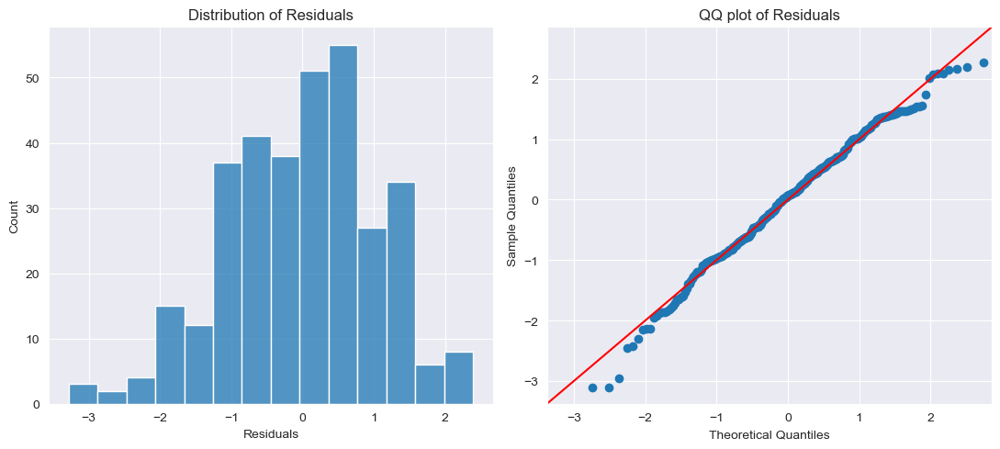

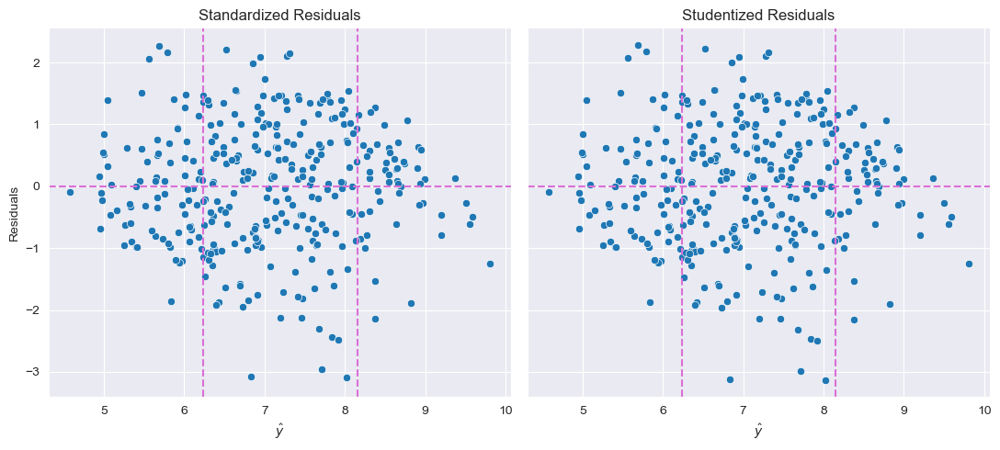

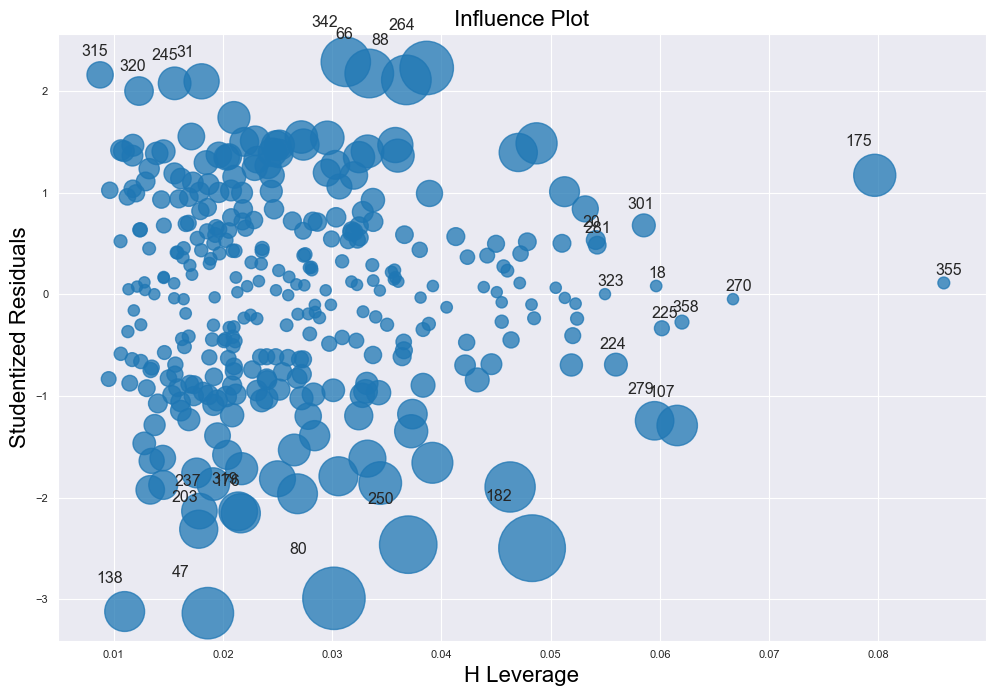

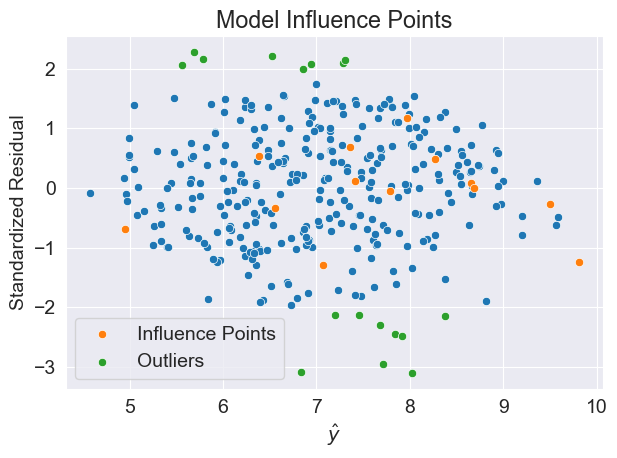

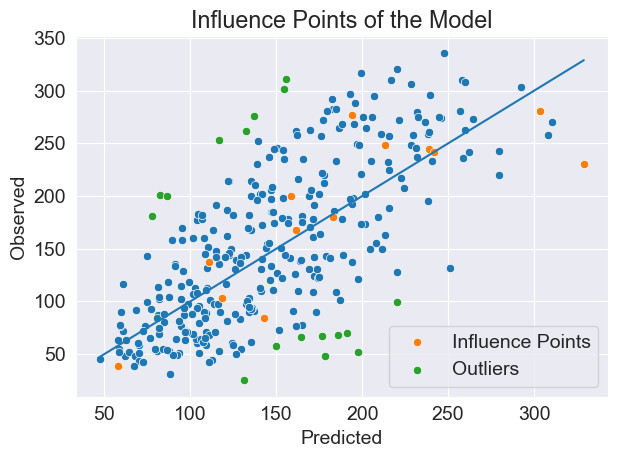

In [45]:
formula = 'I(Y**lamb) ~ AGE + BMI + BP + S1 + S2 + S5 + Male + I(AGE**2)'
model = smf.ols(formula, Xy_train).fit()
print(model.summary2())

resid = model.resid
pred = model.fittedvalues

plt.rc('font',size=10)
fig, ax = linearity_test(model, y_train**lamb)
fig.tight_layout()

fig, axs = plot_resid_dist_qqplot(model)

print(f'\nResiduals Normal Test result p-value: {stats.normaltest(resid).pvalue}\n')

influence = model.get_influence()
standard_resid = influence.resid_studentized_internal
student_resid = influence.resid_studentized_external

fig, (ax1, ax2) = plot_stand_stud_resid(model)

plt.rc('font',size=8)
fig, ax = plt.subplots(figsize=(10,7))
smg.influence_plot(model, ax=ax)
plt.tight_layout()

pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})
infpts = Xy_train[influence.hat_matrix_diag > 2 * (model.df_model + 1)/model.nobs].index
alpha=0.05
outliers = Xy_train[abs(influence.resid_studentized) > stats.t.ppf(1-alpha/2, df=model.df_resid)].index
pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})

plt.rc('font',size=14)
fig, ax = plt.subplots()
sns.scatterplot(x=model.predict(), y=standard_resid, ax=ax)
sns.scatterplot(x=pred_df.loc[infpts]['pred'], y=pred_df.loc[infpts]['stand_res'], ax=ax, label='Influence Points')
sns.scatterplot(x=pred_df.loc[outliers]['pred'], y=pred_df.loc[outliers]['stand_res'], ax=ax, label='Outliers')
ax.set_title('Model Influence Points')
ax.set_xlabel('$\hat{y}$')
ax.set_ylabel('Standardized Residual')
fig.tight_layout()

fig, ax = plt.subplots()
sns.scatterplot(x=model.fittedvalues**(1/lamb), y=y_train, ax=ax)
sns.scatterplot(x=pred[infpts]**(1/lamb), y=y_train[infpts], ax=ax, label='Influence Points')
sns.scatterplot(x=pred[outliers]**(1/lamb), y=y_train[outliers], ax=ax, label='Outliers')
sns.lineplot(x=model.fittedvalues**(1/lamb), y=model.fittedvalues**(1/lamb), ax=ax)
ax.set_title('Influence Points of the Model')
ax.set_xlabel('Predicted')
ax.set_ylabel('Observed')
fig.tight_layout()

_, Xdm = dmatrices(formula, data=Xy_train, return_type='dataframe')
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(Xdm.values, ii) \
              for ii in range(Xdm.shape[1])]
vif['features'] = Xdm.columns
print(vif)

The intercept is not significant, lets remove it and see the result.

                        Results: Ordinary least squares
Model:                  OLS              Adj. R-squared (uncentered): 0.978    
Dependent Variable:     I(Y ** lamb)     AIC:                         998.2161 
Date:                   2023-08-21 20:28 BIC:                         1028.6812
No. Observations:       333              Log-Likelihood:              -491.11  
Df Model:               8                F-statistic:                 1842.    
Df Residuals:           325              Prob (F-statistic):          1.35e-265
R-squared (uncentered): 0.978            Scale:                       1.1457   
-----------------------------------------------------------------------------------
                 Coef.      Std.Err.        t        P>|t|       [0.025      0.975]
-----------------------------------------------------------------------------------
AGE             -0.0907       0.0206     -4.4069     0.0000     -0.1311     -0.0502
BMI              0.0962       0.0162      5.9469

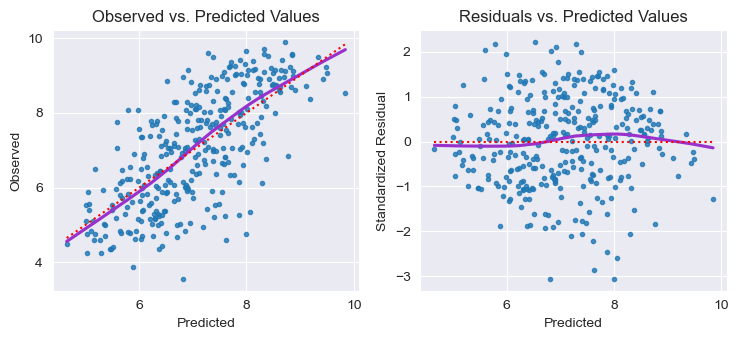

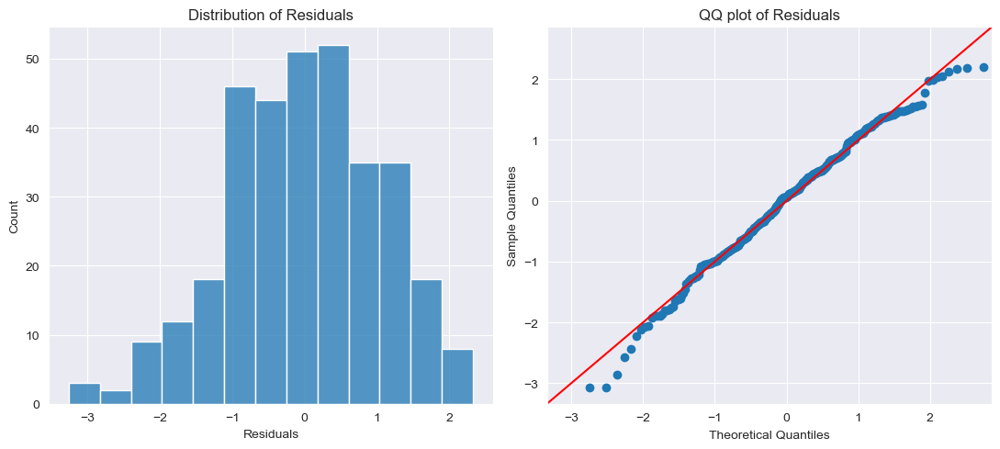

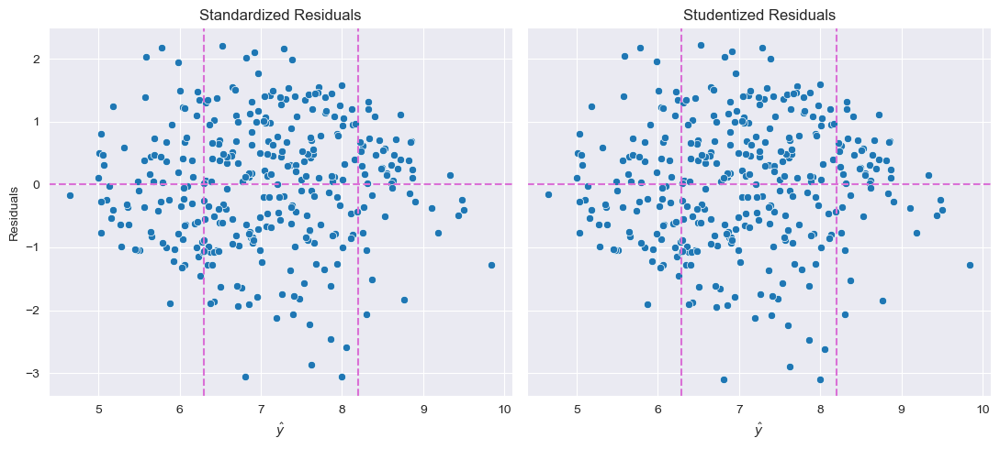

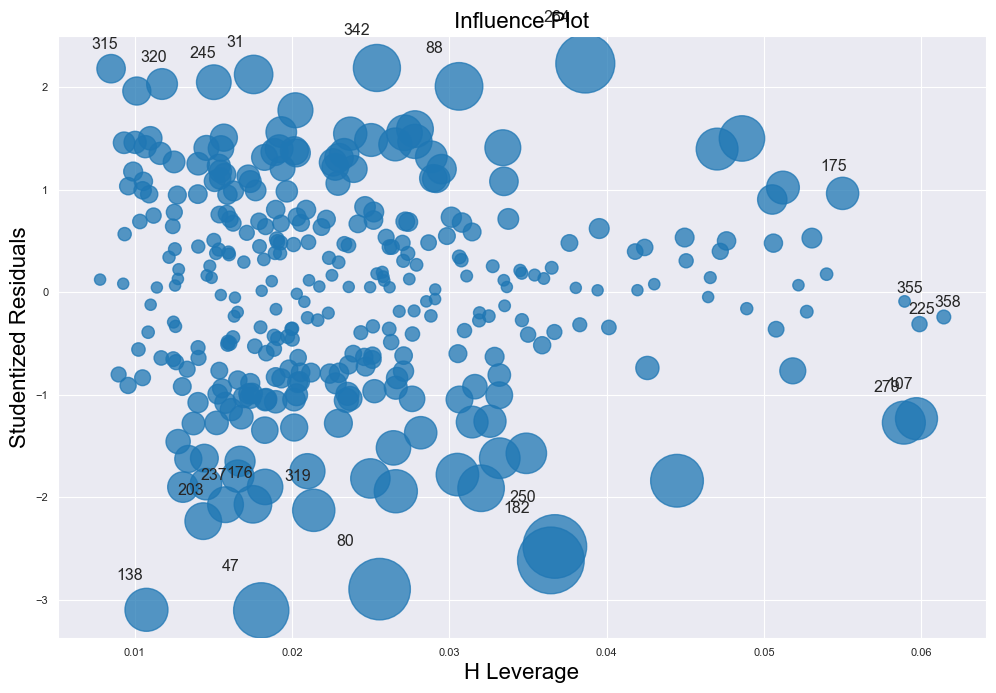

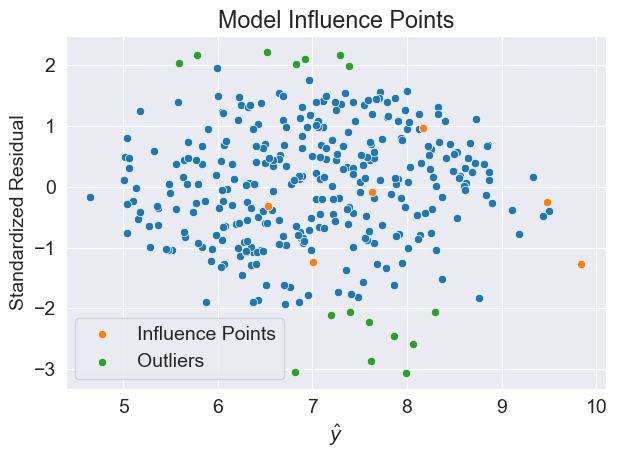

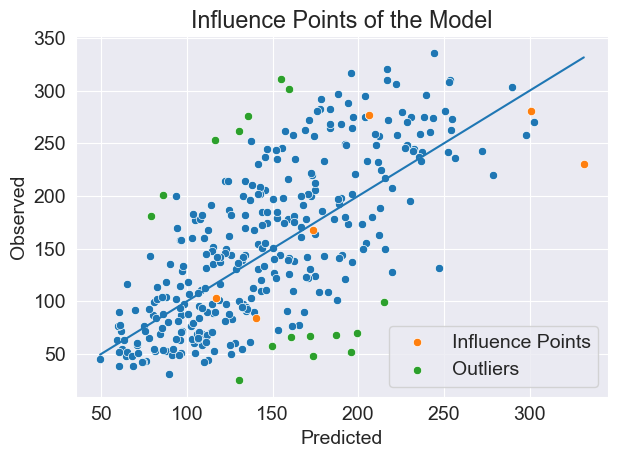

In [46]:
formula = 'I(Y**lamb) ~ AGE + BMI + BP + S1 + S2 + S5 + Male + I(AGE**2) - 1'
model = smf.ols(formula, Xy_train).fit()
print(model.summary2())

resid = model.resid
pred = model.fittedvalues

plt.rc('font',size=10)
fig, ax = linearity_test(model, y_train**lamb)
fig.tight_layout()

fig, axs = plot_resid_dist_qqplot(model)

print(f'\nResiduals Normal Test result p-value: {stats.normaltest(resid).pvalue}\n')

influence = model.get_influence()
standard_resid = influence.resid_studentized_internal
student_resid = influence.resid_studentized_external

fig, (ax1, ax2) = plot_stand_stud_resid(model)

plt.rc('font',size=8)
fig, ax = plt.subplots(figsize=(10,7))
smg.influence_plot(model, ax=ax)
plt.tight_layout()

pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})
infpts = Xy_train[influence.hat_matrix_diag > 2 * (model.df_model + 1)/model.nobs].index
alpha=0.05
outliers = Xy_train[abs(influence.resid_studentized) > stats.t.ppf(1-alpha/2, df=model.df_resid)].index
pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})

plt.rc('font',size=14)
fig, ax = plt.subplots()
sns.scatterplot(x=model.predict(), y=standard_resid, ax=ax)
sns.scatterplot(x=pred_df.loc[infpts]['pred'], y=pred_df.loc[infpts]['stand_res'], ax=ax, label='Influence Points')
sns.scatterplot(x=pred_df.loc[outliers]['pred'], y=pred_df.loc[outliers]['stand_res'], ax=ax, label='Outliers')
ax.set_title('Model Influence Points')
ax.set_xlabel('$\hat{y}$')
ax.set_ylabel('Standardized Residual')
fig.tight_layout()

fig, ax = plt.subplots()
sns.scatterplot(x=model.fittedvalues**(1/lamb), y=y_train, ax=ax)
sns.scatterplot(x=pred[infpts]**(1/lamb), y=y_train[infpts], ax=ax, label='Influence Points')
sns.scatterplot(x=pred[outliers]**(1/lamb), y=y_train[outliers], ax=ax, label='Outliers')
sns.lineplot(x=model.fittedvalues**(1/lamb), y=model.fittedvalues**(1/lamb), ax=ax)
ax.set_title('Influence Points of the Model')
ax.set_xlabel('Predicted')
ax.set_ylabel('Observed')
fig.tight_layout()

_, Xdm = dmatrices(formula, data=Xy_train, return_type='dataframe')
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(Xdm.values, ii) \
              for ii in range(Xdm.shape[1])]
vif['features'] = Xdm.columns
print(vif)

print(f'\nExplained variance: {explained_variance_score(y_train**lamb, model.predict())}')

AIC and BIC improved. All terms still significant.

                 Results: Ordinary least squares
Model:              OLS              Adj. R-squared:     0.506    
Dependent Variable: I(Y ** lamb)     AIC:                988.8667 
Date:               2023-08-21 20:28 BIC:                1026.9482
No. Observations:   333              Log-Likelihood:     -484.43  
Df Model:           9                F-statistic:        38.74    
Df Residuals:       323              Prob (F-statistic): 2.22e-46 
R-squared:          0.519            Scale:              1.1075   
-------------------------------------------------------------------
                Coef.   Std.Err.     t     P>|t|    [0.025   0.975]
-------------------------------------------------------------------
Intercept       3.4081    2.4299   1.4025  0.1617  -1.3724   8.1886
AGE            -0.0137    0.0063  -2.1686  0.0308  -0.0262  -0.0013
BMI            -0.1089    0.0920  -1.1841  0.2373  -0.2899   0.0720
BP             -0.0333    0.0262  -1.2751  0.2032  -0.0848   0.0181
S1    

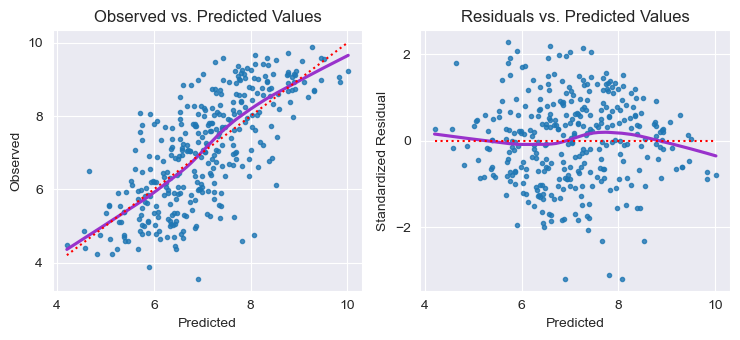

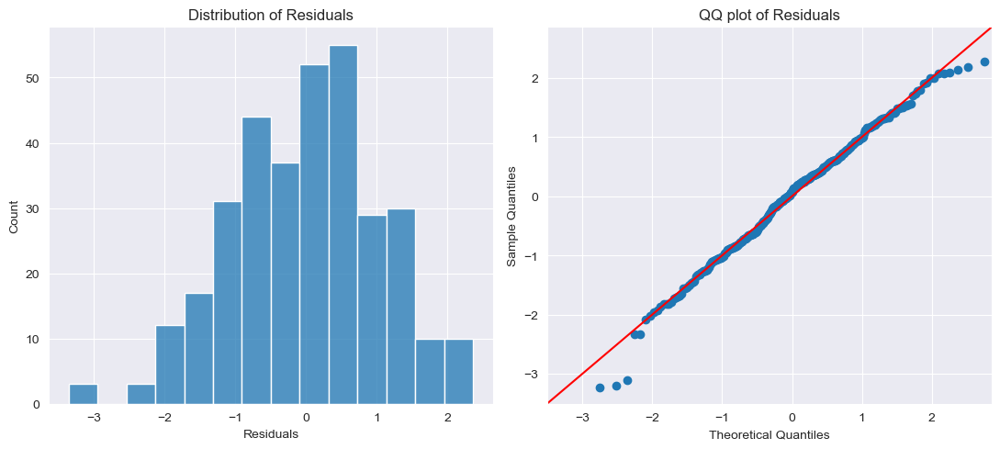

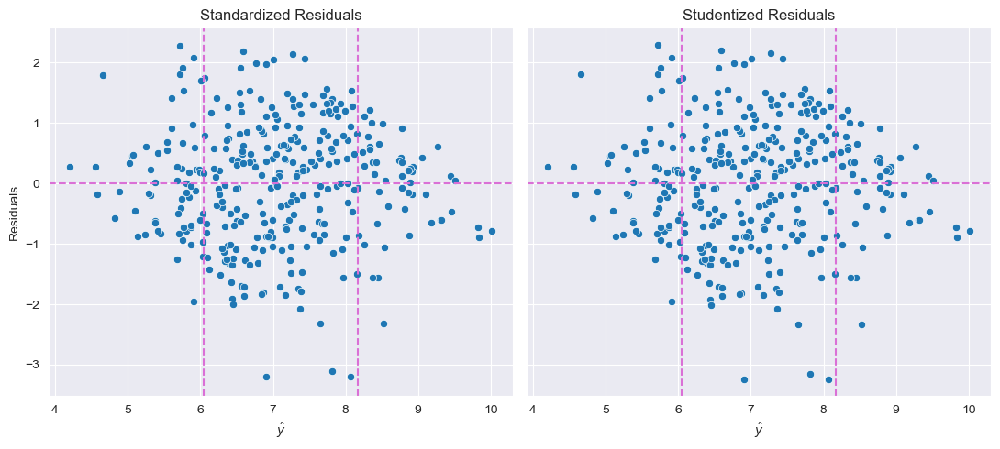

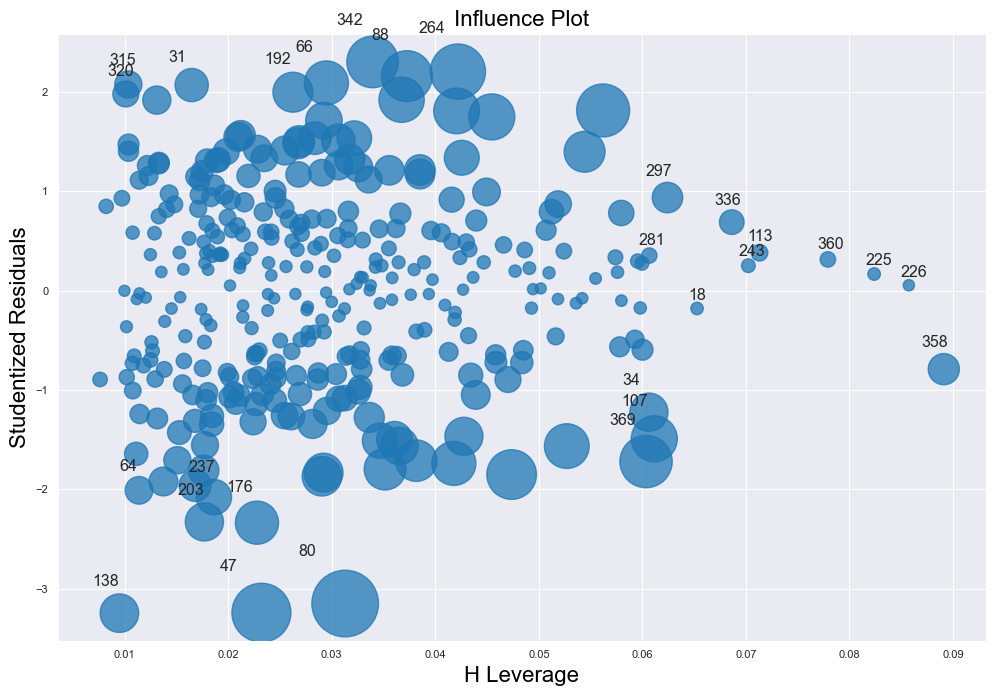

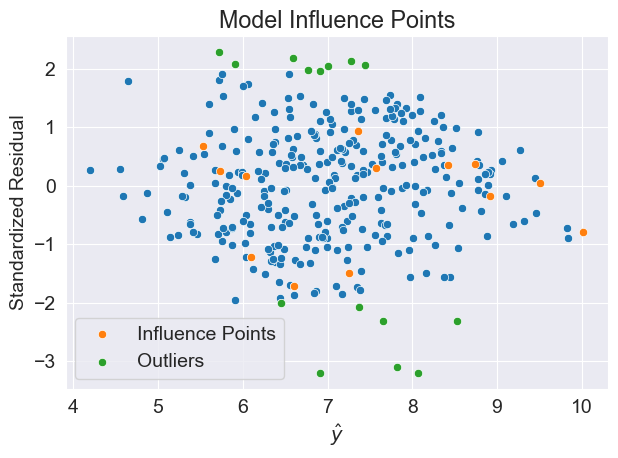

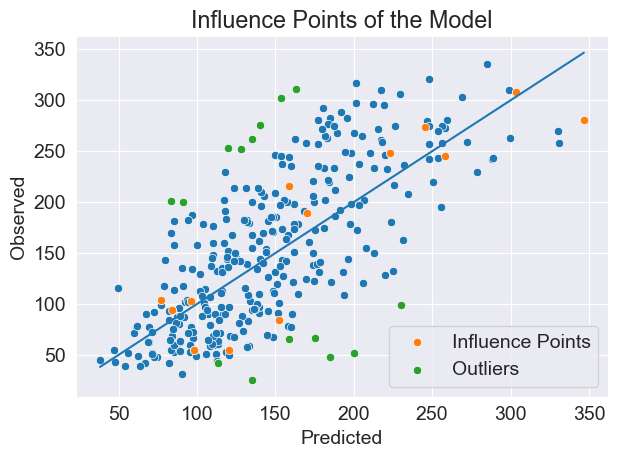

In [47]:
formula = 'I(Y**lamb) ~ AGE + BMI + BP + S1 + S2 + S5 + Male + AGE:Male + BMI:BP'
model = smf.ols(formula, Xy_train).fit()
print(model.summary2())

resid = model.resid
pred = model.fittedvalues

plt.rc('font',size=10)
fig, ax = linearity_test(model, y_train**lamb)
fig.tight_layout()

fig, axs = plot_resid_dist_qqplot(model)

print(f'\nResiduals Normal Test result p-value: {stats.normaltest(resid).pvalue}\n')

influence = model.get_influence()
standard_resid = influence.resid_studentized_internal
student_resid = influence.resid_studentized_external

fig, (ax1, ax2) = plot_stand_stud_resid(model)

plt.rc('font',size=8)
fig, ax = plt.subplots(figsize=(10,7))
smg.influence_plot(model, ax=ax)
plt.tight_layout()

pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})
infpts = Xy_train[influence.hat_matrix_diag > 2 * (model.df_model + 1)/model.nobs].index
alpha=0.05
outliers = Xy_train[abs(influence.resid_studentized) > stats.t.ppf(1-alpha/2, df=model.df_resid)].index
pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})

plt.rc('font',size=14)
fig, ax = plt.subplots()
sns.scatterplot(x=model.predict(), y=standard_resid, ax=ax)
sns.scatterplot(x=pred_df.loc[infpts]['pred'], y=pred_df.loc[infpts]['stand_res'], ax=ax, label='Influence Points')
sns.scatterplot(x=pred_df.loc[outliers]['pred'], y=pred_df.loc[outliers]['stand_res'], ax=ax, label='Outliers')
ax.set_title('Model Influence Points')
ax.set_xlabel('$\hat{y}$')
ax.set_ylabel('Standardized Residual')
fig.tight_layout()

fig, ax = plt.subplots()
sns.scatterplot(x=model.fittedvalues**(1/lamb), y=y_train, ax=ax)
sns.scatterplot(x=pred[infpts]**(1/lamb), y=y_train[infpts], ax=ax, label='Influence Points')
sns.scatterplot(x=pred[outliers]**(1/lamb), y=y_train[outliers], ax=ax, label='Outliers')
sns.lineplot(x=model.fittedvalues**(1/lamb), y=model.fittedvalues**(1/lamb), ax=ax)
ax.set_title('Influence Points of the Model')
ax.set_xlabel('Predicted')
ax.set_ylabel('Observed')
fig.tight_layout()

_, Xdm = dmatrices(formula, data=Xy_train, return_type='dataframe')
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(Xdm.values, ii) \
              for ii in range(Xdm.shape[1])]
vif['features'] = Xdm.columns
print(vif)

Intercept again not significant, lets remove and check.

                        Results: Ordinary least squares
Model:                  OLS              Adj. R-squared (uncentered): 0.979    
Dependent Variable:     I(Y ** lamb)     AIC:                         988.8886 
Date:                   2023-08-21 20:28 BIC:                         1023.1619
No. Observations:       333              Log-Likelihood:              -485.44  
Df Model:               9                F-statistic:                 1690.    
Df Residuals:           324              Prob (F-statistic):          2.42e-266
R-squared (uncentered): 0.979            Scale:                       1.1108   
-----------------------------------------------------------------------------------
                 Coef.      Std.Err.        t        P>|t|       [0.025      0.975]
-----------------------------------------------------------------------------------
AGE             -0.0145       0.0063     -2.3013     0.0220     -0.0270     -0.0021
BMI              0.0148       0.0260      0.5693

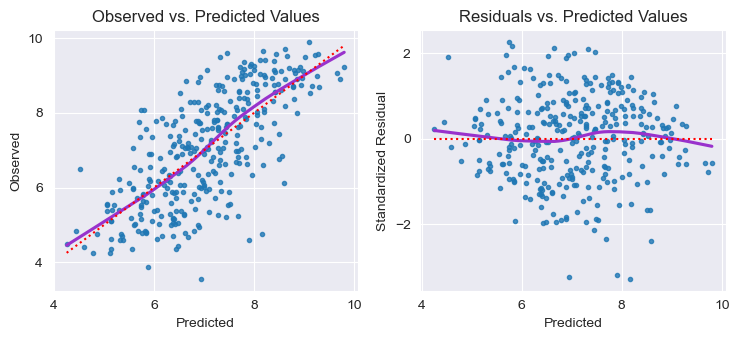

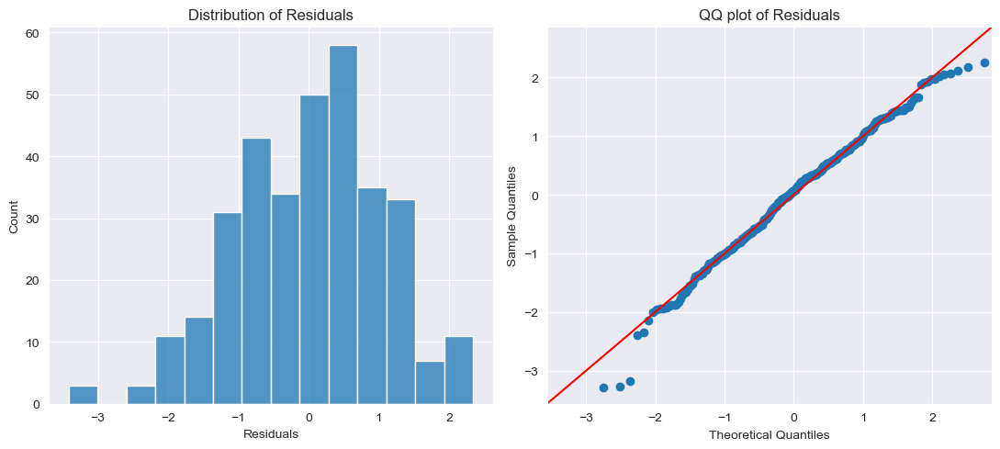

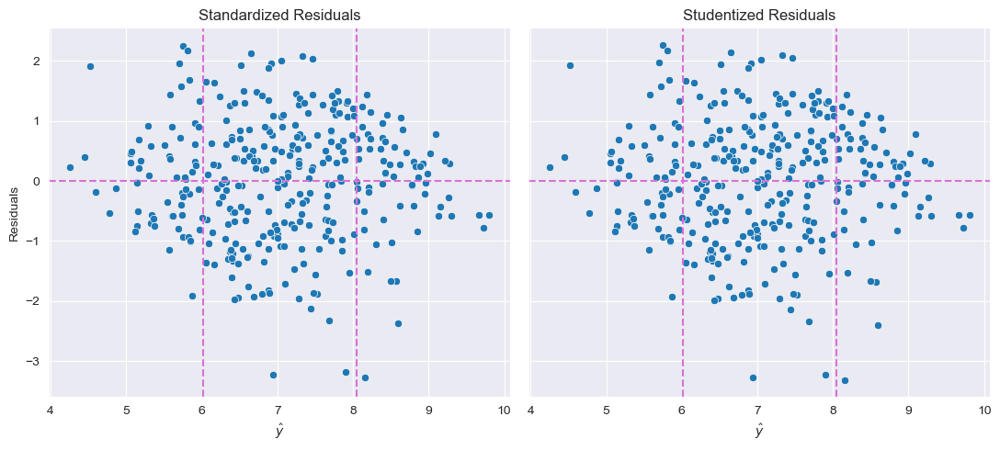

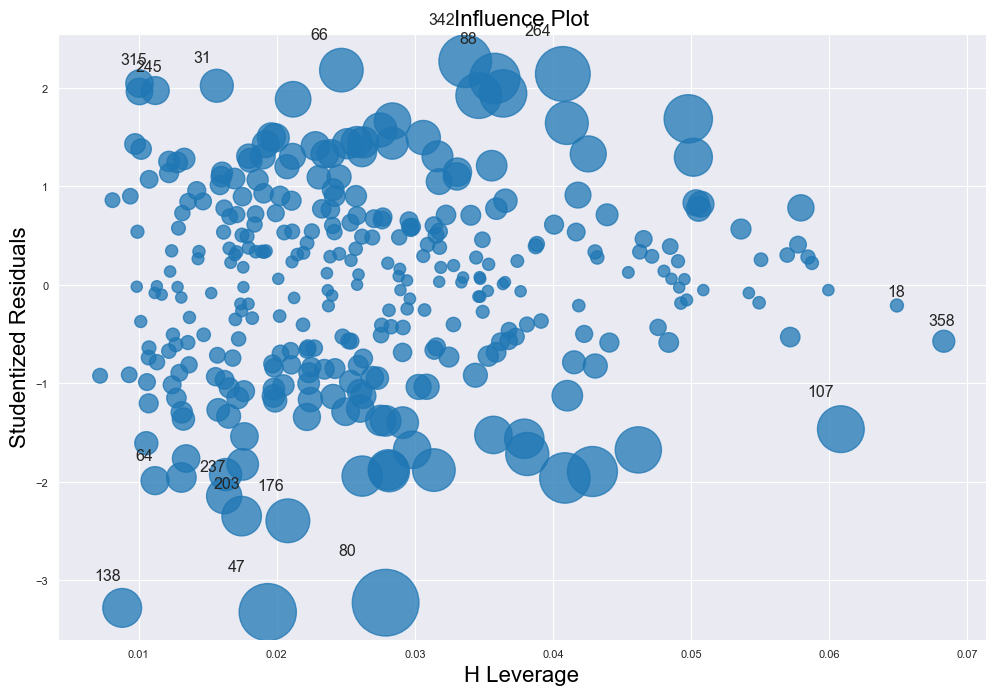

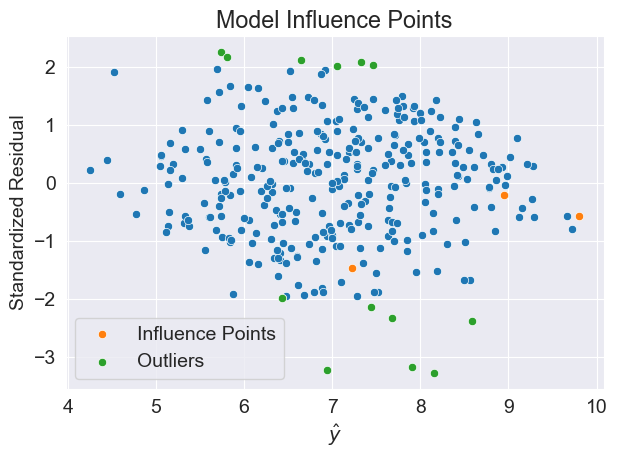

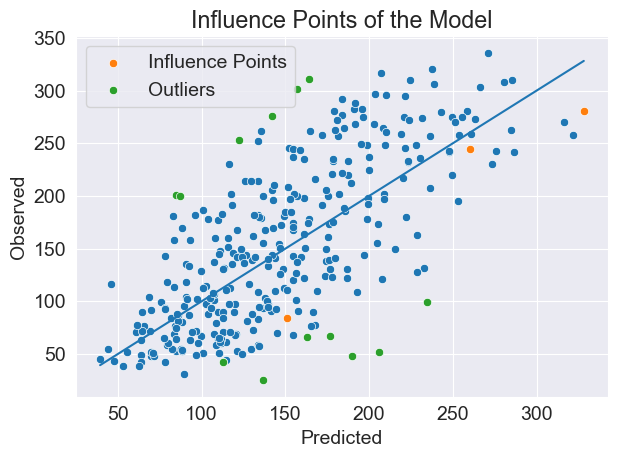

In [48]:
formula = 'I(Y**lamb) ~ AGE + BMI + BP + S1 + S2 + S5 + Male + AGE:Male + BMI:BP -1'
model = smf.ols(formula, Xy_train).fit()
print(model.summary2())

resid = model.resid
pred = model.fittedvalues

plt.rc('font',size=10)
fig, ax = linearity_test(model, y_train**lamb)
fig.tight_layout()

fig, axs = plot_resid_dist_qqplot(model)

print(f'\nResiduals Normal Test result p-value: {stats.normaltest(resid).pvalue}\n')

influence = model.get_influence()
standard_resid = influence.resid_studentized_internal
student_resid = influence.resid_studentized_external

fig, (ax1, ax2) = plot_stand_stud_resid(model)

plt.rc('font',size=8)
fig, ax = plt.subplots(figsize=(10,7))
smg.influence_plot(model, ax=ax)
plt.tight_layout()

pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})
infpts = Xy_train[influence.hat_matrix_diag > 2 * (model.df_model + 1)/model.nobs].index
alpha=0.05
outliers = Xy_train[abs(influence.resid_studentized) > stats.t.ppf(1-alpha/2, df=model.df_resid)].index
pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})

plt.rc('font',size=14)
fig, ax = plt.subplots()
sns.scatterplot(x=model.predict(), y=standard_resid, ax=ax)
sns.scatterplot(x=pred_df.loc[infpts]['pred'], y=pred_df.loc[infpts]['stand_res'], ax=ax, label='Influence Points')
sns.scatterplot(x=pred_df.loc[outliers]['pred'], y=pred_df.loc[outliers]['stand_res'], ax=ax, label='Outliers')
ax.set_title('Model Influence Points')
ax.set_xlabel('$\hat{y}$')
ax.set_ylabel('Standardized Residual')
fig.tight_layout()

fig, ax = plt.subplots()
sns.scatterplot(x=model.fittedvalues**(1/lamb), y=y_train, ax=ax)
sns.scatterplot(x=pred[infpts]**(1/lamb), y=y_train[infpts], ax=ax, label='Influence Points')
sns.scatterplot(x=pred[outliers]**(1/lamb), y=y_train[outliers], ax=ax, label='Outliers')
sns.lineplot(x=model.fittedvalues**(1/lamb), y=model.fittedvalues**(1/lamb), ax=ax)
ax.set_title('Influence Points of the Model')
ax.set_xlabel('Predicted')
ax.set_ylabel('Observed')
fig.tight_layout()

_, Xdm = dmatrices(formula, data=Xy_train, return_type='dataframe')
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(Xdm.values, ii) \
              for ii in range(Xdm.shape[1])]
vif['features'] = Xdm.columns
print(vif)

print(f'\nExplained variance: {explained_variance_score(y_train**lamb, model.predict())}')

***
# Comparison and Validation

In [49]:
from sklearn.metrics import mean_squared_error

In [50]:
models = []

formula = 'Y ~ BMI + BP + S1 + S5 + Male'
models.append(smf.ols(formula, Xy_train).fit())

formula = 'Y ~ BMI + BP + S1 + S2 + S5 + Male'
models.append(smf.ols(formula, Xy_train).fit())

formula = 'Y ~ AGE + BMI + BP + S1 + S2 + S5 + Male + I(AGE**2)'
models.append(smf.ols(formula, Xy_train).fit())

formula = 'Y ~ AGE + BMI + BP + S1 + S2 + S5 + Male + AGE:Male + BMI:BP'
models.append(smf.ols(formula, Xy_train).fit())

formula = 'Y ~ AGE + BMI + BP + S1 + S2 + S5 + Male + AGE:Male + BMI:BP -1'
models.append(smf.ols(formula, Xy_train).fit())

modelsT = []
# transformed y
formula = 'I(Y**lamb) ~ BMI + BP + S1 + S5 + Male'
modelsT.append(smf.ols(formula, Xy_train).fit())

formula = 'I(Y**lamb) ~ BMI + BP + S1 + S2 + S5 + Male'
modelsT.append(smf.ols(formula, Xy_train).fit())

formula = 'I(Y**lamb) ~ AGE + BMI + BP + S1 + S2 + S5 + Male + I(AGE**2)'
modelsT.append(smf.ols(formula, Xy_train).fit())

formula = 'I(Y**lamb) ~ AGE + BMI + BP + S1 + S2 + S5 + Male + AGE:Male + BMI:BP'
modelsT.append(smf.ols(formula, Xy_train).fit())

formula = 'I(Y**lamb) ~ AGE + BMI + BP + S1 + S2 + S5 + Male + AGE:Male + BMI:BP -1'
modelsT.append(smf.ols(formula, Xy_train).fit())

formula = 'I(Y**lamb) ~ AGE + BMI + BP + S1 + S2 + S5 + Male + I(AGE**2) -1'
modelsT.append(smf.ols(formula, Xy_train).fit())

In [51]:
# compare model fit
print('Model   R2     R2a      AIC       BIC')
for idx, model in enumerate(models):
    print(f'{idx:3}   {model.rsquared:5.3f}   {model.rsquared_adj:5.3f}   {model.aic:7.2f}   {model.bic:7.2f}')
for idx, model in enumerate(modelsT):
    print(f' T{idx}   {model.rsquared:5.3f}   {model.rsquared_adj:5.3f}   {model.aic:7.2f}   {model.bic:7.2f}')


Model   R2     R2a      AIC       BIC
  0   0.490   0.482   3627.30   3650.15
  1   0.503   0.494   3620.57   3647.23
  2   0.509   0.497   3620.46   3654.74
  3   0.533   0.519   3606.25   3644.33
  4   0.906   0.904   3604.37   3638.65
 T0   0.473   0.465   1011.33   1034.18
 T1   0.492   0.483   1001.12   1027.77
 T2   0.502   0.489    998.75   1033.03
 T3   0.519   0.506    988.87   1026.95
 T4   0.979   0.979    988.89   1023.16
 T5   0.978   0.978    998.22   1028.68


Model 4 has the best BIC scores out of the models that are not transformed.   
Model T5 has the best of those with Y transformed.   
Both use the same terms.

In [52]:
# check the validation data
print('Model   RMSE_Training   RMSE_Validation')
for idx, model in enumerate(models):
    print(f'{idx:3}   {np.sqrt(model.mse_resid):12.3f}   {np.sqrt(mean_squared_error(y_val, model.predict(X_val))):14.3f}')
for idx, model in enumerate(modelsT):
    # have to account for the transformatio in y to compare the models
    n = model.nobs
    k = model.df_model
    rmse_train = np.sqrt(np.sum((y_train - model.predict()**(1/lamb))**2) / (n-(k+1)))
    print(f' T{idx}   {rmse_train:12.3f}   {np.sqrt(mean_squared_error(y_val, model.predict(X_val)**(1/lamb))):14.3f}')

Model   RMSE_Training   RMSE_Validation
  0         55.620           52.902
  1         54.979           50.890
  2         54.810           51.282
  3         53.574           50.397
  4         53.501           50.386
 T0         56.292           54.235
 T1         55.283           51.247
 T2         55.361           51.957
 T3         54.180           51.108
 T4         54.164           50.895
 T5         55.611           52.799


Model 4 has the lowest RMSE on both the training and validation sets.  

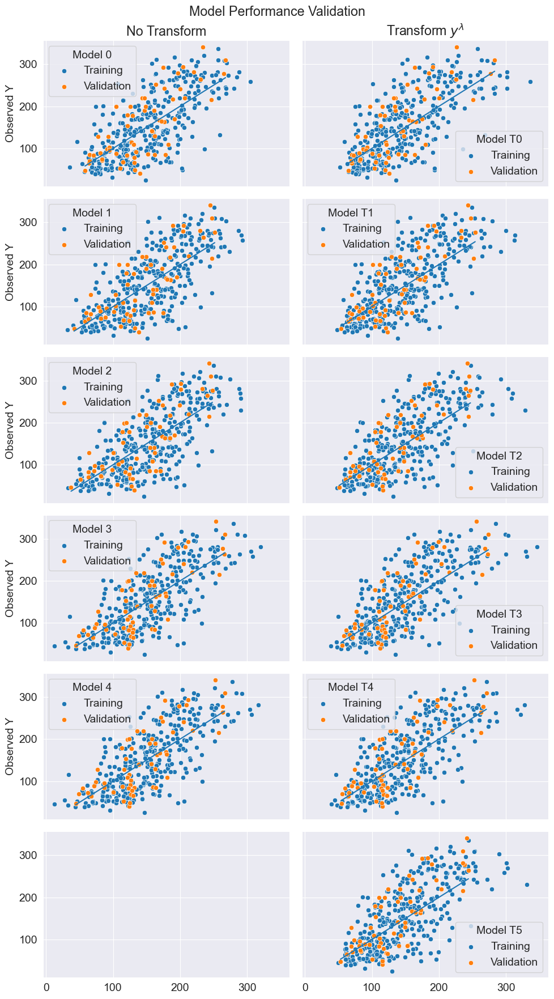

In [53]:
nrows = np.max([len(models),len(modelsT)])
fig, axs = plt.subplots(nrows=nrows,ncols=2, figsize=(10,3*nrows), sharex=True, sharey=True)
for idx, model in enumerate(models):
    pred_val = model.predict(X_val)
    pred_train = model.predict(X_train)
    sns.scatterplot(x=pred_train, y=y_train, ax=axs[idx][0], label='Training')
    sns.scatterplot(x=pred_val, y=y_val, ax=axs[idx][0], label='Validation')
    sns.lineplot(x=pred_val, y=pred_val, ax=axs[idx][0])
    axs[idx][0].set_ylabel('Observed Y')        
    axs[idx][0].legend(title=f'Model {idx}')
for idx, model in enumerate(modelsT):
    pred_val = model.predict(X_val)**(1/lamb)
    pred_train = model.predict(X_train)**(1/lamb)
    sns.scatterplot(x=pred_train, y=y_train, ax=axs[idx][1], label='Training')
    sns.scatterplot(x=pred_val, y=y_val, ax=axs[idx][1], label='Validation')
    sns.lineplot(x=pred_val, y=pred_val, ax=axs[idx][1])
    axs[idx][1].legend(title=f'Model T{idx}')

        
axs[0][0].set_title('No Transform')
axs[0][1].set_title('Transform $y^\lambda$')
axs[3][0].set_xlabel('Predicted Y')
axs[3][1].set_xlabel('Predicted Y')
fig.suptitle('Model Performance Validation')
fig.tight_layout()

I am going to use model 4 for the test predictions. 

***
# Get Test Predictions

In [54]:
# create dummy variable for SEX to match the model
X_test['Male'] = 0
X_test.loc[X_test['SEX']=='Male', 'Male'] = 1

In [55]:
selected_model_number = 4
transform = False
if transform:
    model = modelsT[selected_model_number]
else:
    model = models[selected_model_number]

In [56]:
dfpred = model.get_prediction(X_test,row_labels=X_test.index).summary_frame(0.1)
dfpred.head()

,mean,mean_se,mean_ci_lower,mean_ci_upper,obs_ci_lower,obs_ci_upper
392,212.047374,7.540446,199.608879,224.485870,122.920821,301.173927
393,71.522098,6.611067,60.616679,82.427517,-17.403458,160.447654
394,62.040768,7.946667,48.932183,75.149353,-27.181770,151.263306
395,134.738198,11.390560,115.948671,153.527726,44.505872,224.970524
396,218.287194,8.103845,204.919333,231.655054,129.026194,307.548193


In [57]:
# create dataframe with prediction and prediction ci
if transform:
    # transform values
    predictions = pd.DataFrame({'Y':dfpred['mean']**(1/lamb), 'Lower':dfpred['obs_ci_lower']**(1/lamb), 'Upper':dfpred['obs_ci_upper']**(1/lamb)})
else:
    predictions = pd.DataFrame({'Y':dfpred['mean'], 'Lower':dfpred['obs_ci_lower'], 'Upper':dfpred['obs_ci_upper']})
predictions.head()

,Y,Lower,Upper
392,212.047374,122.920821,301.173927
393,71.522098,-17.403458,160.447654
394,62.040768,-27.181770,151.263306
395,134.738198,44.505872,224.970524
396,218.287194,129.026194,307.548193


In [58]:
# save to file
predictions.to_csv('predictions.csv')

In [59]:
print(model.summary2())

                        Results: Ordinary least squares
Model:                  OLS              Adj. R-squared (uncentered): 0.904    
Dependent Variable:     Y                AIC:                         3604.3747
Date:                   2023-08-21 20:28 BIC:                         3638.6480
No. Observations:       333              Log-Likelihood:              -1793.2  
Df Model:               9                F-statistic:                 348.0    
Df Residuals:           324              Prob (F-statistic):          1.01e-160
R-squared (uncentered): 0.906            Scale:                       2862.4   
----------------------------------------------------------------------------------
                 Coef.      Std.Err.       t       P>|t|       [0.025      0.975] 
----------------------------------------------------------------------------------
AGE              -0.6952      0.3206    -2.1683    0.0309      -1.3260     -0.0644
BMI              -6.6417      1.3223    -5.0227    0

In [60]:
explained_variance_score(y_train, model.predict())

0.5323363630861362

***
# Figures for report

In [61]:
resid = model.resid
pred = model.fittedvalues

pred_val = model.predict(X_val)
pred_train = model.predict(X_train)

print(f'\nResiduals Normal Test result p-value: {stats.normaltest(resid).pvalue}\n')

influence = model.get_influence()
standard_resid = influence.resid_studentized_internal
student_resid = influence.resid_studentized_external

infpts = Xy_train[influence.hat_matrix_diag > 2 * (model.df_model + 1)/model.nobs].index
alpha=0.05
outliers = Xy_train[abs(influence.resid_studentized) > stats.t.ppf(1-alpha/2, df=model.df_resid)].index
pred_df = pd.DataFrame({'pred':pred, 'resid':resid, 'stand_res':standard_resid, 'stud_res':student_resid})


formula = 'Y ~ AGE + BMI + BP + S1 + S2 + S5 + Male + AGE:Male + BMI:BP -1'

_, Xdm = dmatrices(formula, data=Xy_train, return_type='dataframe')
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(Xdm.values, ii) for ii in range(Xdm.shape[1])]
vif['features'] = Xdm.columns
print(vif)


Residuals Normal Test result p-value: 0.726421844617145

          VIF  features
0   30.344607       AGE
1  147.905152       BMI
2  123.556439        BP
3  280.361400        S1
4  110.836096        S2
5  172.360010        S5
6   28.641648      Male
7   30.174389  AGE:Male
8  105.935723    BMI:BP


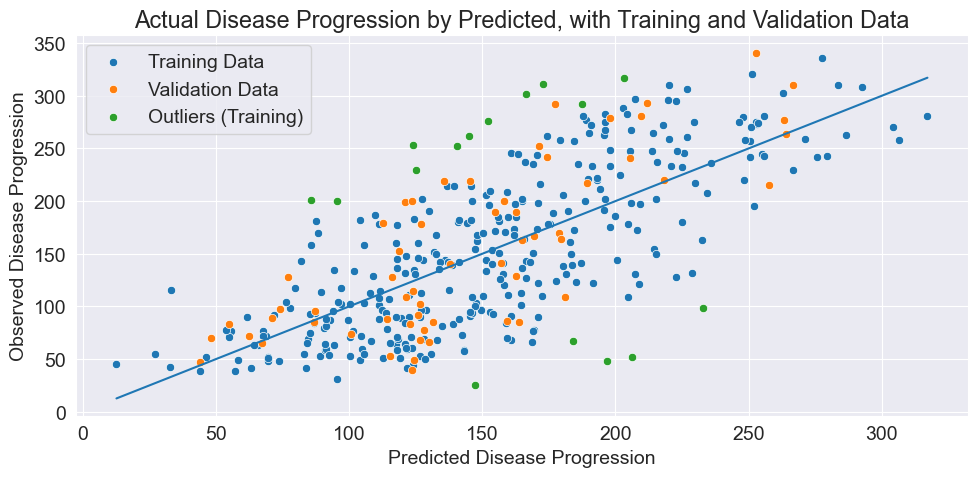

In [62]:
# act vs pred scatterplot
plt.rc('font',size=14)
fig, ax = plt.subplots(figsize=(10,5))
# sns.scatterplot(x=model.fittedvalues, y=y_train, ax=ax)
sns.scatterplot(x=pred_train, y=y_train, ax=ax, label='Training Data')
sns.scatterplot(x=pred_val, y=y_val, ax=ax, label='Validation Data')
# sns.scatterplot(x=pred[infpts], y=y_train[infpts], ax=ax, label='Influence Points')
sns.scatterplot(x=pred[outliers], y=y_train[outliers], ax=ax, label='Outliers (Training)')
sns.lineplot(x=model.fittedvalues, y=model.fittedvalues, ax=ax)
ax.set_title('Actual Disease Progression by Predicted, with Training and Validation Data')
ax.set_xlabel('Predicted Disease Progression')
ax.set_ylabel('Observed Disease Progression')
# ax.legend(bbox_to_anchor=(1,1))
fig.tight_layout()
fig.savefig('1_model_obs_pred.png')

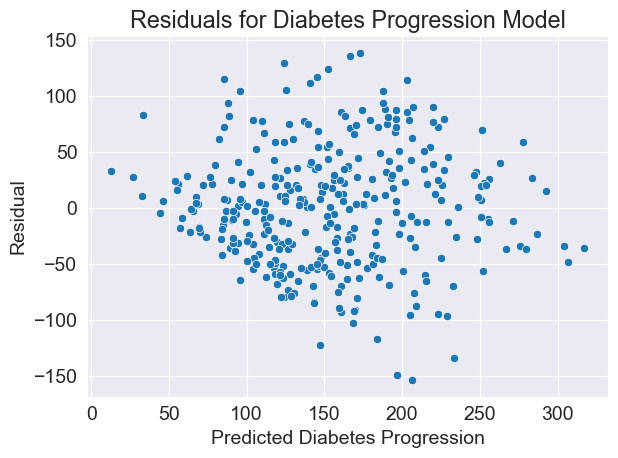

In [63]:
fig, ax = plt.subplots()
sns.scatterplot(x=model.predict(), y=model.resid, ax=ax)
ax.set_title('Residuals for Diabetes Progression Model')
ax.set_xlabel('Predicted Diabetes Progression')
ax.set_ylabel('Residual')
fig.tight_layout()
fig.savefig('1_res_vs_pred.png')

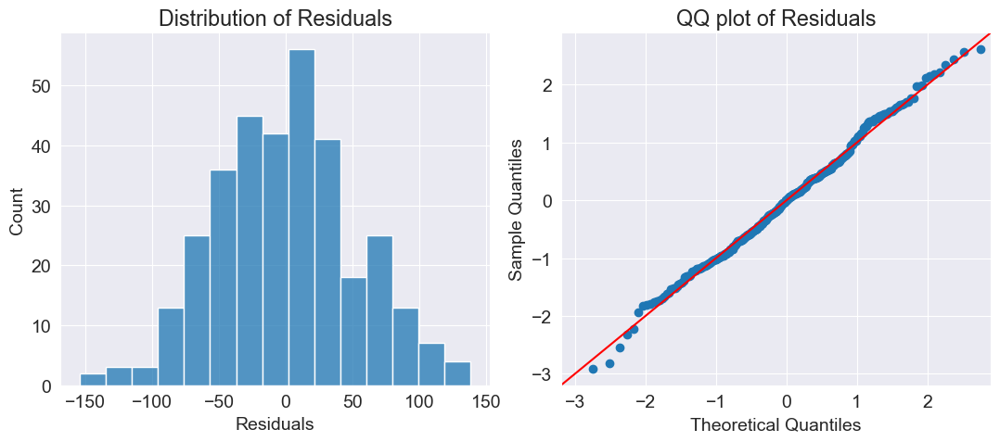

In [64]:
fig, axs = plot_resid_dist_qqplot(model)
fig.savefig('1_normal_resid.png')

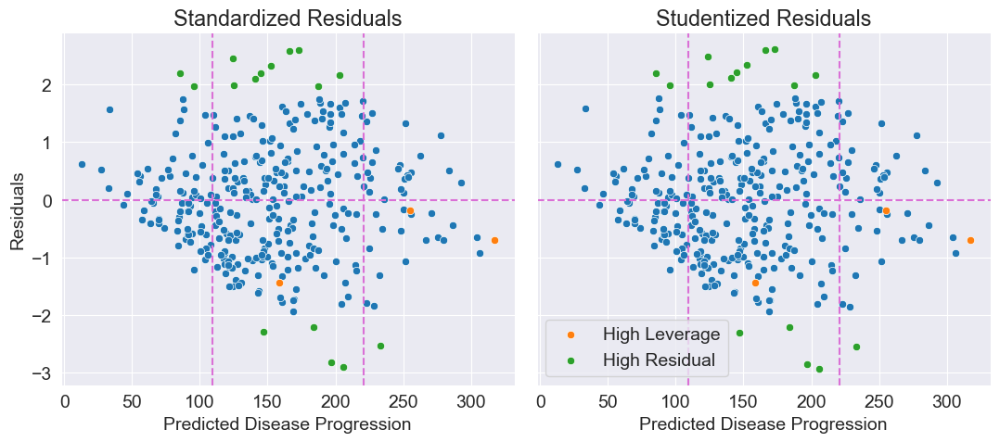

In [65]:

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(11,5), sharey=True)
sns.scatterplot(x=model.predict(), y=standard_resid, ax=ax1)
sns.scatterplot(x=pred_df.loc[infpts]['pred'], y=pred_df.loc[infpts]['stand_res'], ax=ax1, label='High Leverage')
sns.scatterplot(x=pred_df.loc[outliers]['pred'], y=pred_df.loc[outliers]['stand_res'], ax=ax1, label='High Residual')
sns.scatterplot(x=model.predict(), y=student_resid, ax=ax2)
sns.scatterplot(x=pred_df.loc[infpts]['pred'], y=pred_df.loc[infpts]['stud_res'], ax=ax2, label='High Leverage')
sns.scatterplot(x=pred_df.loc[outliers]['pred'], y=pred_df.loc[outliers]['stud_res'], ax=ax2, label='High Residual')
for ax in [ax1,ax2]:
    xlim = ax.get_xlim()
    ax.axvline(x=xlim[0] + 1/3*(xlim[1]-xlim[0]), color='orchid', linestyle='--')
    ax.axvline(x=xlim[0] + 2/3*(xlim[1]-xlim[0]), color='orchid', linestyle='--')
    ax.axhline(y=0, color='orchid', linestyle='--')
    ax.set_xlabel('Predicted Disease Progression')
    ax.set_ylabel('Residuals')

ax1.legend().remove()
ax1.set_title('Standardized Residuals')
ax2.set_title('Studentized Residuals')
fig.tight_layout()
fig.savefig('1_stand_stud_resid.png')



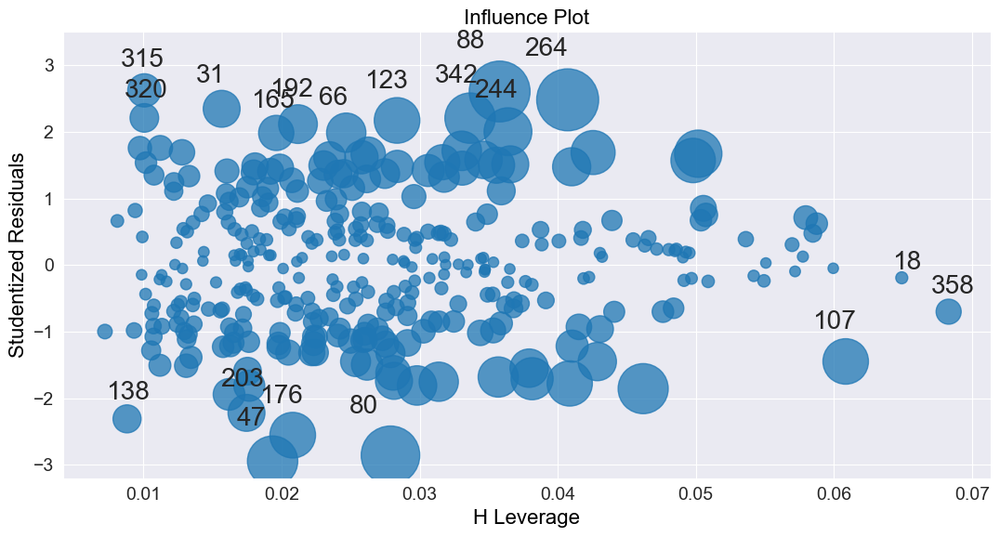

In [66]:
fig, ax = plt.subplots(figsize=(11,6))
smg.influence_plot(model, ax=ax)
ax.set_ylim([-3.2,3.5])
fig.tight_layout()
fig.savefig('1_influence_plot')

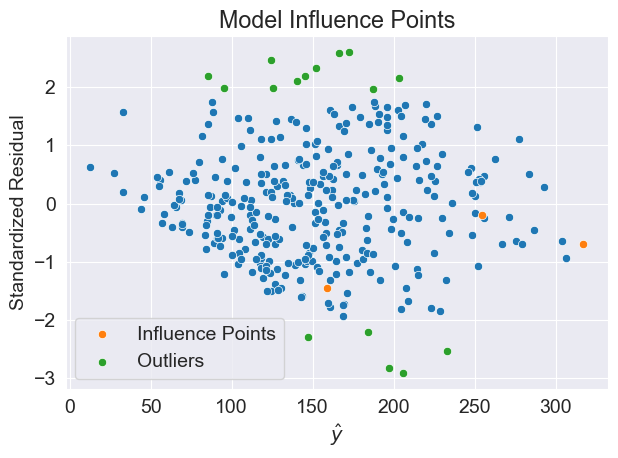

In [67]:
plt.rc('font',size=14)
fig, ax = plt.subplots()
sns.scatterplot(x=model.predict(), y=standard_resid, ax=ax)
sns.scatterplot(x=pred_df.loc[infpts]['pred'], y=pred_df.loc[infpts]['stand_res'], ax=ax, label='Influence Points')
sns.scatterplot(x=pred_df.loc[outliers]['pred'], y=pred_df.loc[outliers]['stand_res'], ax=ax, label='Outliers')
ax.set_title('Model Influence Points')
ax.set_xlabel('$\hat{y}$')
ax.set_ylabel('Standardized Residual')
fig.tight_layout()